In [ ]:
!pip install joblib==1.1.0
!pip install mglearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.0/307.0 KB 5.3 MB/s eta 0:00:00
  Attempting uninstall: joblib
    Found existing installation: joblib 1.2.0
    Uninstalling joblib-1.2.0:
      Successfully uninstalled joblib-1.2.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 KB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for mglearn: filename=mglearn-0.1.9-py2.py3-none-any.whl size=582637 sha256=339947fb5203db40cbd3d36249b1d8c1cb996f69a400484c6eafd6e37aca40f2
  Stored in directory: /root/.cache/pip/wheels/87/75/37/404e66d0c4bad150f101c9a0914b11a8eccc2681559936e7f7
Successfully built mglearn


#Handling Missing Data

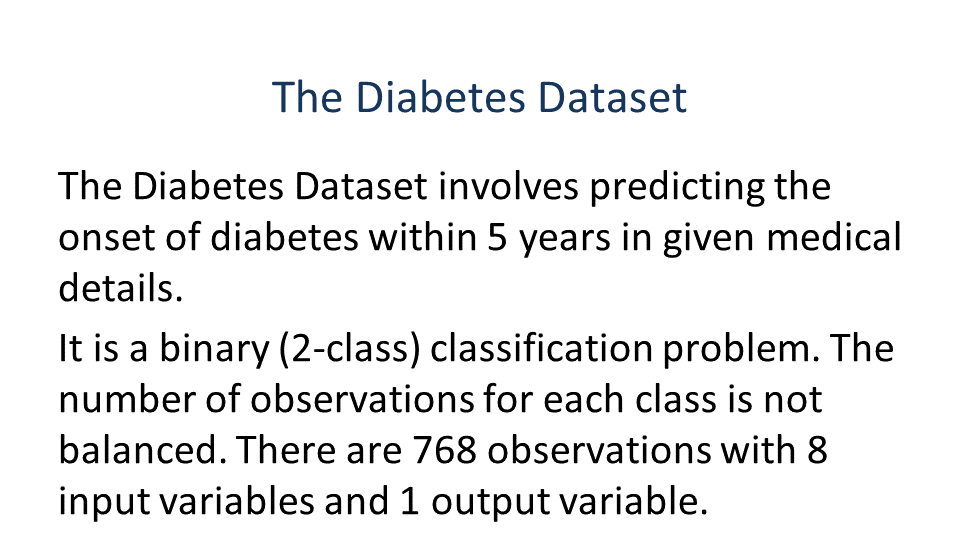

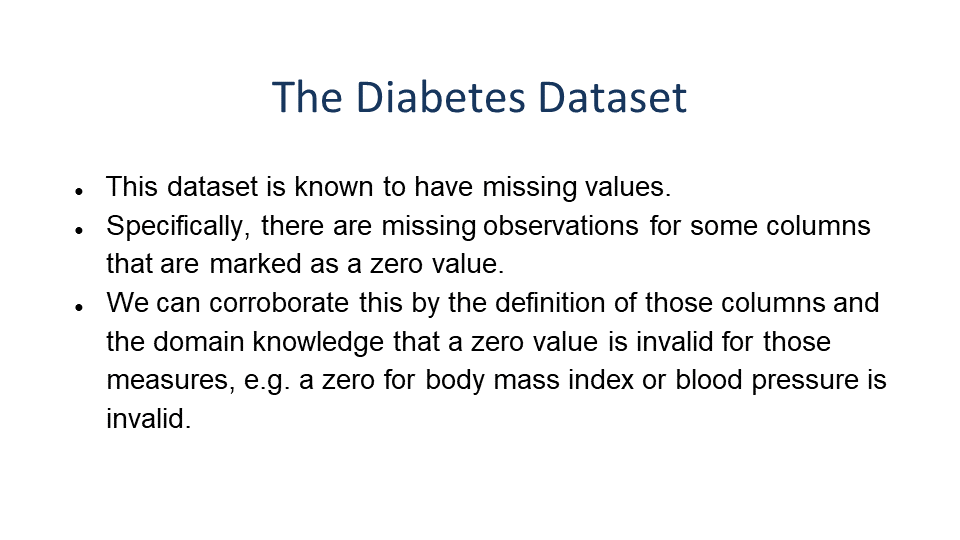

#Diabetes Dataset

The Diabetes Dataset involves predicting the onset of diabetes within 5 years in given medical details.
It is a binary (2-class) classification problem. The number of observations for each class is not balanced. There are 768 observations with 8 input variables and 1 output variable. The variable names are as follows:
0. Number of times pregnant.
1. Plasma glucose concentration a 2 hours in an oral glucose tolerance test.
2. Diastolic blood pressure (mm Hg).
3. Triceps skinfold thickness (mm).
4. 2-Hour serum insulin (mu U/ml).
5. Body mass index (weight in kg/(height in m)^2).
6. Diabetes pedigree function.
7. Age (years).
8. Class variable (0 or 1).

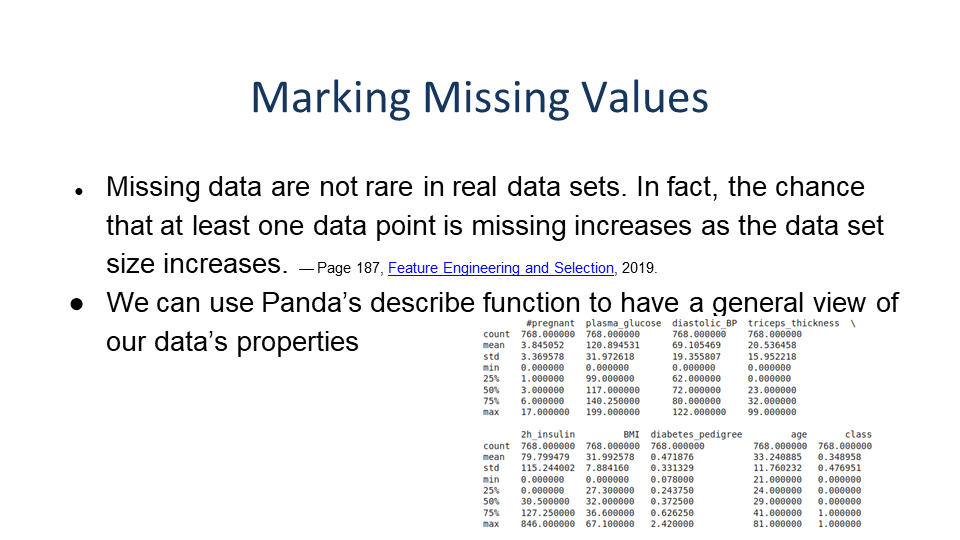

In [ ]:
# load and summarize the dataset
import pandas as pd
from pandas import read_csv
# load the dataset
url="https://raw.githubusercontent.com/profandresg/pyzero/main/pima-indians-diabetes.txt"
dataset = read_csv(url, header=None, names=['#pregnant','plasma_glucose','diastolic_BP','triceps_thickness','2h_insulin','BMI','diabetes_pedigree','age','class'])
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
display(dataset.values)
# summarize the dataset
print(dataset.describe())

<ipython-input-2-c9d522835cfc>:10: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


array([[  6.   , 148.   ,  72.   , ...,   0.627,  50.   ,   1.   ],
       [  1.   ,  85.   ,  66.   , ...,   0.351,  31.   ,   0.   ],
       [  8.   , 183.   ,  64.   , ...,   0.672,  32.   ,   1.   ],
       ...,
       [  5.   , 121.   ,  72.   , ...,   0.245,  30.   ,   0.   ],
       [  1.   , 126.   ,  60.   , ...,   0.349,  47.   ,   1.   ],
       [  1.   ,  93.   ,  70.   , ...,   0.315,  23.   ,   0.   ]])

        #pregnant  plasma_glucose  diastolic_BP  triceps_thickness  \
count  768.000000  768.000000      768.000000    768.000000          
mean   3.845052    120.894531      69.105469     20.536458           
std    3.369578    31.972618       19.355807     15.952218           
min    0.000000    0.000000        0.000000      0.000000            
25%    1.000000    99.000000       62.000000     0.000000            
50%    3.000000    117.000000      72.000000     23.000000           
75%    6.000000    140.250000      80.000000     32.000000           
max    17.000000   199.000000      122.000000    99.000000           

       2h_insulin         BMI  diabetes_pedigree         age       class  
count  768.000000  768.000000  768.000000         768.000000  768.000000  
mean   79.799479   31.992578   0.471876           33.240885   0.348958    
std    115.244002  7.884160    0.331329           11.760232   0.476951    
min    0.000000    0.000000    0.078000           21.000000   0.00000

Missing values are frequently indicated by out-of-range entries; perhaps a negative number (e.g., -1) in a numeric field that is normally only positive, or a 0 in a numeric field that can never normally be 0.
Specifically, the following columns have an invalid zero minimum value:

1: Plasma glucose concentration
2: Diastolic blood pressure
3: Triceps skinfold thickness
4: 2-Hour serum insulin
5: Body mass index

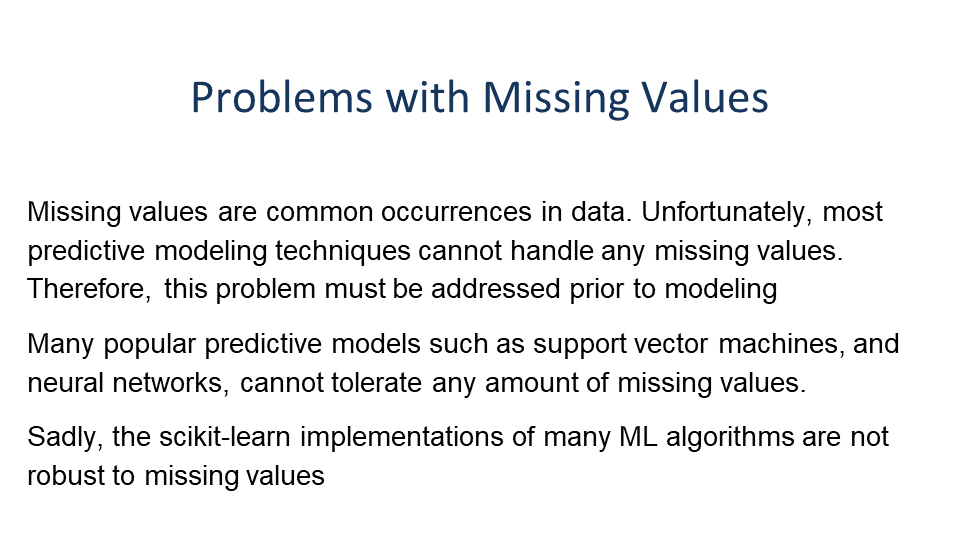

#Mark Missing Values

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
print(dataset.head(20))
print(dataset.tail(20))

    #pregnant  plasma_glucose  diastolic_BP  triceps_thickness  2h_insulin  \
0   6          148             72            35                 0            
1   1          85              66            29                 0            
2   8          183             64            0                  0            
3   1          89              66            23                 94           
4   0          137             40            35                 168          
5   5          116             74            0                  0            
6   3          78              50            32                 88           
7   10         115             0             0                  0            
8   2          197             70            45                 543          
9   8          125             96            0                  0            
10  4          110             92            0                  0            
11  10         168             74            0                  

<ipython-input-3-668ecd1a3693>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


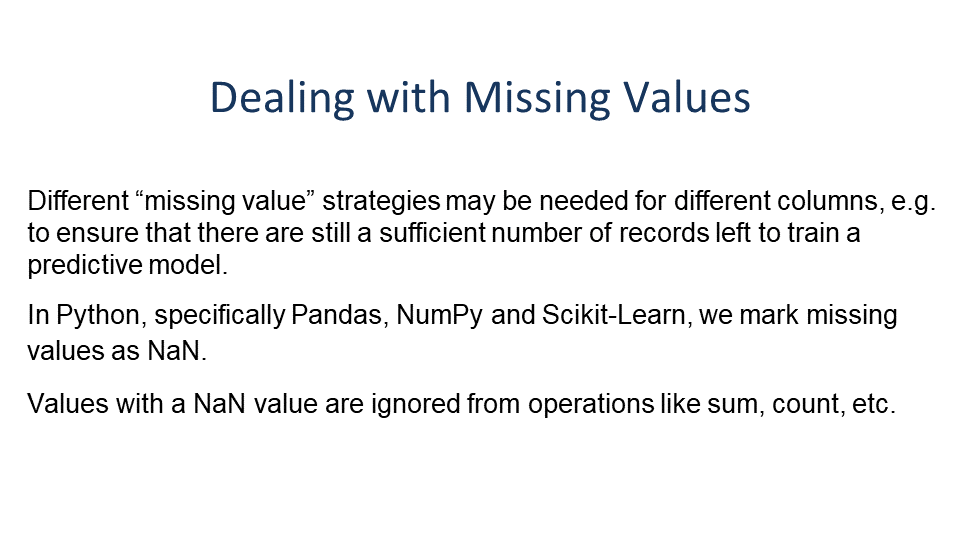

In [ ]:
num_missing = (dataset[['plasma_glucose','diastolic_BP','triceps_thickness','2h_insulin','BMI']] == 0).sum()
print(num_missing)

plasma_glucose       5  
diastolic_BP         35 
triceps_thickness    227
2h_insulin           374
BMI                  11 
dtype: int64


This highlights that different “missing value” strategies may be needed for different columns, e.g. to ensure that there are still a sufficient number of records left to train a predictive model.

When a predictor is discrete in nature, missingness can be directly encoded into the predictor as if it were a naturally occurring category.

In [ ]:
from numpy import nan
dataset[['plasma_glucose','diastolic_BP','triceps_thickness','2h_insulin','BMI']] = dataset[['plasma_glucose','diastolic_BP','triceps_thickness','2h_insulin','BMI']].replace(0, nan)
# count the number of nan values in each column
print(dataset.isnull().sum())

#pregnant            0  
plasma_glucose       5  
diastolic_BP         35 
triceps_thickness    227
2h_insulin           374
BMI                  11 
diabetes_pedigree    0  
age                  0  
class                0  
dtype: int64


In [ ]:
display(dataset.head(20))
display(dataset.tail(20))

,#pregnant,plasma_glucose,diastolic_BP,triceps_thickness,2h_insulin,BMI,diabetes_pedigree,age,class
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
5,5,116.0,74.0,NaN,NaN,25.6,0.201,30,0
6,3,78.0,50.0,32.0,88.0,31.0,0.248,26,1
7,10,115.0,NaN,NaN,NaN,35.3,0.134,29,0
8,2,197.0,70.0,45.0,543.0,30.5,0.158,53,1
9,8,125.0,96.0,NaN,NaN,NaN,0.232,54,1


,#pregnant,plasma_glucose,diastolic_BP,triceps_thickness,2h_insulin,BMI,diabetes_pedigree,age,class
748,3,187.0,70.0,22.0,200.0,36.4,0.408,36,1
749,6,162.0,62.0,NaN,NaN,24.3,0.178,50,1
750,4,136.0,70.0,NaN,NaN,31.2,1.182,22,1
751,1,121.0,78.0,39.0,74.0,39.0,0.261,28,0
752,3,108.0,62.0,24.0,NaN,26.0,0.223,25,0
753,0,181.0,88.0,44.0,510.0,43.3,0.222,26,1
754,8,154.0,78.0,32.0,NaN,32.4,0.443,45,1
755,1,128.0,88.0,39.0,110.0,36.5,1.057,37,1
756,7,137.0,90.0,41.0,NaN,32.0,0.391,39,0
757,0,123.0,72.0,NaN,NaN,36.3,0.258,52,1


#Missing Values Causes Problems
Missing values are common occurrences in data. Unfortunately, most predictive modeling techniques cannot handle any missing values. Therefore, this problem must be addressed prior to modeling.

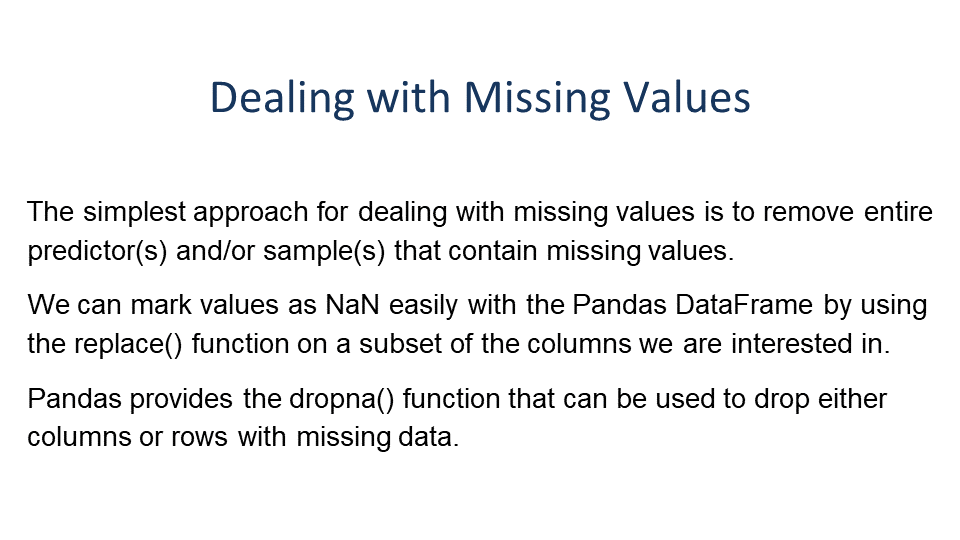

#Remove Rows With Missing Values
The simplest approach for dealing with missing values is to remove entire predictor(s) and/or sample(s) that contain missing values.

In [ ]:
print(dataset.shape)
# drop rows with missing values
dataset_remnan=dataset.copy()
dataset_remnan.dropna(inplace=True)
# summarize the shape of the data with missing rows removed
print(dataset.shape)
print(dataset_remnan.shape)


(768, 9)
(768, 9)
(392, 9)


#Impute Missing Values
missing data can be imputed. In this case, we can use information in the training set predictors to, in essence, estimate the values of other predictors.

There are many options we could consider when replacing a missing value, for example:

A constant value that has meaning within the domain, such as 0, distinct from all other values.
A value from another randomly selected record.
A mean, median or mode value for the column.
A value estimated by another predictive model.
Any imputing performed on the training dataset will have to be performed on new data in the future when predictions are needed from the finalized model. This needs to be taken into consideration when choosing how to impute the missing values.

For example, if you choose to impute with mean column values, these mean column values will need to be stored to file for later use on new data that has missing values.

#Impute using Numpy

In [ ]:
print('Mean Values')
display(dataset.mean())
# manually impute missing values with numpy
dataset_impmean=dataset.copy()
dataset_impmean.fillna(dataset.mean(), inplace=True)
# count the number of NaN values in each column
print('Sum of Null Values')
print(dataset_impmean.isnull().sum())
print(dataset.shape)
print(dataset_impmean.shape)


Mean Values


#pregnant            3.845052  
plasma_glucose       121.686763
diastolic_BP         72.405184 
triceps_thickness    29.153420 
2h_insulin           155.548223
BMI                  32.457464 
diabetes_pedigree    0.471876  
age                  33.240885 
class                0.348958  
dtype: float64

Sum of Null Values
#pregnant            0
plasma_glucose       0
diastolic_BP         0
triceps_thickness    0
2h_insulin           0
BMI                  0
diabetes_pedigree    0
age                  0
class                0
dtype: int64
(768, 9)
(768, 9)


In [ ]:
print('Median Values')
display(dataset.median())
# manually impute missing values with numpy
dataset_impmedian=dataset.copy()
dataset_impmedian.fillna(dataset.median(), inplace=True)
# count the number of NaN values in each column
print('Sum of Null Values')
print(dataset_impmedian.isnull().sum())

Median Values


#pregnant            3.0000  
plasma_glucose       117.0000
diastolic_BP         72.0000 
triceps_thickness    29.0000 
2h_insulin           125.0000
BMI                  32.3000 
diabetes_pedigree    0.3725  
age                  29.0000 
class                0.0000  
dtype: float64

Sum of Null Values
#pregnant            0
plasma_glucose       0
diastolic_BP         0
triceps_thickness    0
2h_insulin           0
BMI                  0
diabetes_pedigree    0
age                  0
class                0
dtype: int64


In [ ]:
print('Mode Values')
display(dataset.mode(dropna=True).iloc[0])
# manually impute missing values with numpy
dataset_impmode=dataset.copy()
dataset_impmode.fillna(dataset.mode(dropna=True).iloc[0], inplace=True)
# count the number of NaN values in each column
print('Sum of Null Values')
print(dataset_impmode.isnull().sum())

Mode Values


#pregnant            1.000  
plasma_glucose       99.000 
diastolic_BP         70.000 
triceps_thickness    32.000 
2h_insulin           105.000
BMI                  32.000 
diabetes_pedigree    0.254  
age                  22.000 
class                0.000  
Name: 0, dtype: float64

Sum of Null Values
#pregnant            0
plasma_glucose       0
diastolic_BP         0
triceps_thickness    0
2h_insulin           0
BMI                  0
diabetes_pedigree    0
age                  0
class                0
dtype: int64


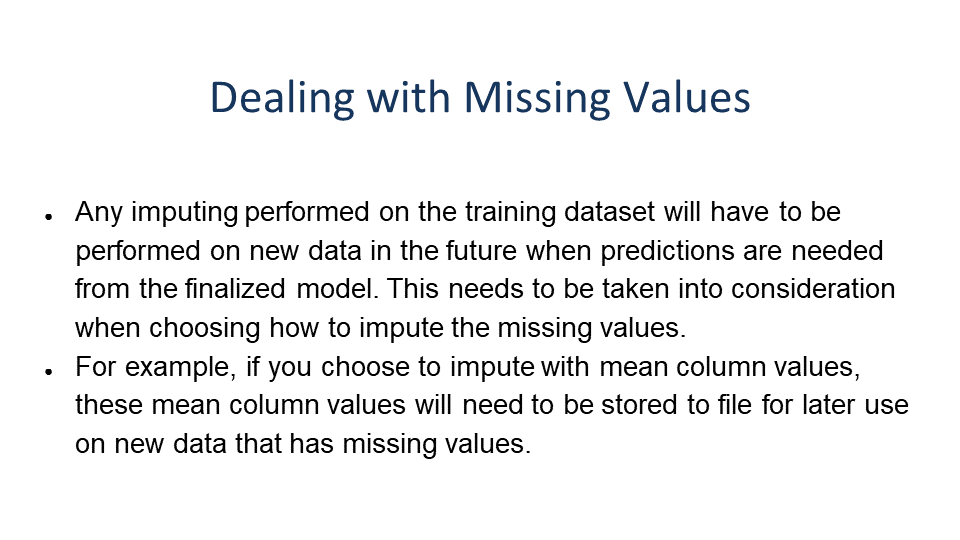

#Data Transformations

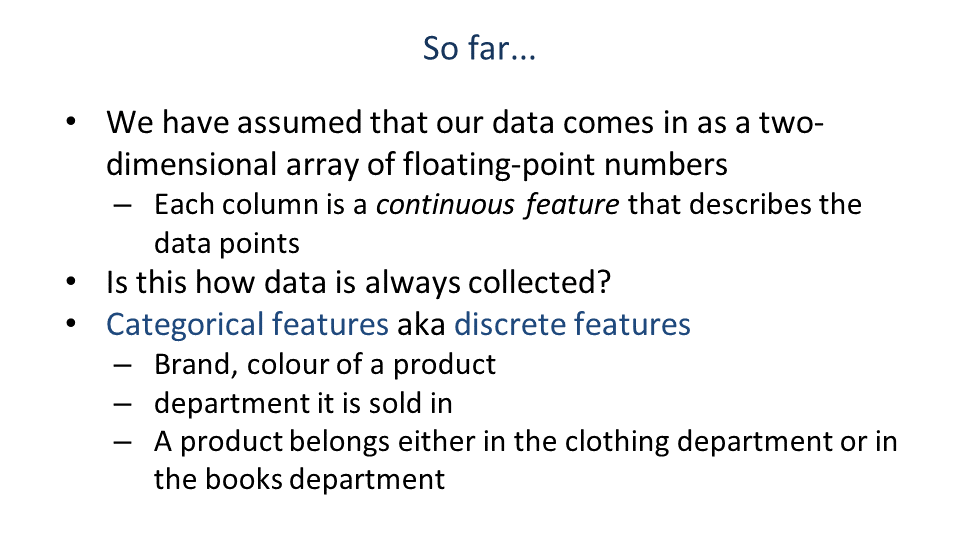

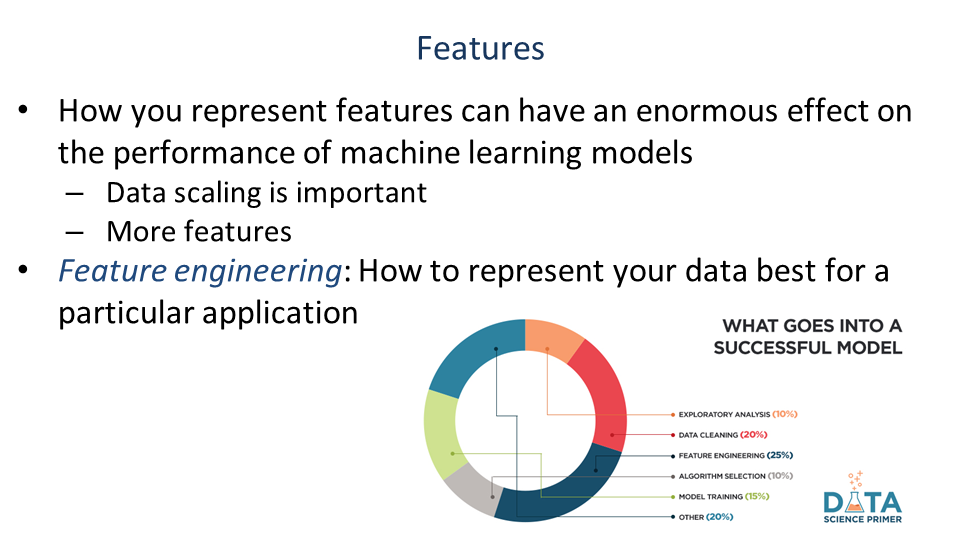

# Scaling continuous data

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import mglearn
%matplotlib inline

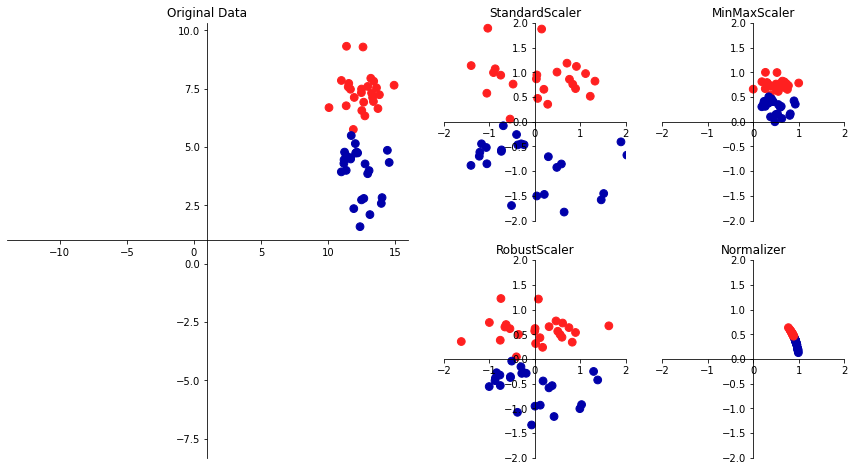

In [ ]:
mglearn.plots.plot_scaling()

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
cancer = load_breast_cancer()

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target,
                                                    random_state=1)
print(X_train.shape)
print(X_test.shape)


(426, 30)
(143, 30)


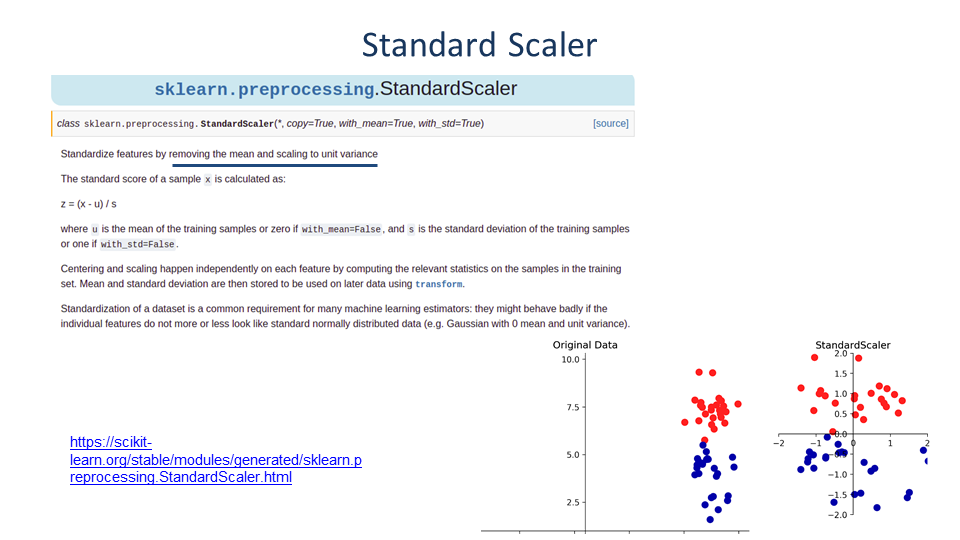

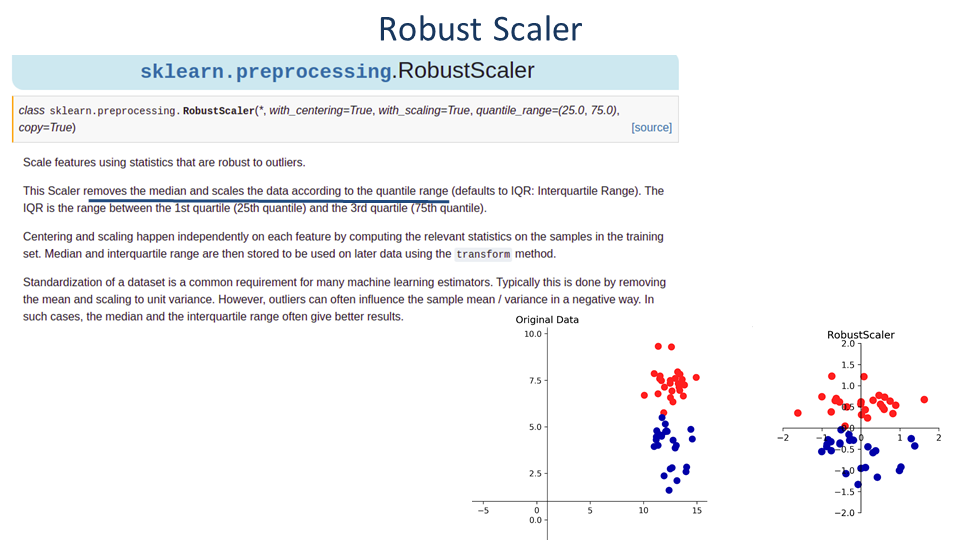

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler

scaler = MinMaxScaler() 
scaler = RobustScaler() 
#scaler = StandardScaler() 

scaler.fit(X_train)

RobustScaler()

transformed shape: (426, 30)
per-feature minimum before scaling:
 [6.981e+00 9.710e+00 4.379e+01 1.435e+02 5.263e-02 1.938e-02 0.000e+00
 0.000e+00 1.060e-01 5.024e-02 1.153e-01 3.602e-01 7.570e-01 6.802e+00
 1.713e-03 2.252e-03 0.000e+00 0.000e+00 9.539e-03 8.948e-04 7.930e+00
 1.202e+01 5.041e+01 1.852e+02 7.117e-02 2.729e-02 0.000e+00 0.000e+00
 1.566e-01 5.521e-02]
per-feature maximum before scaling:
 [2.811e+01 3.928e+01 1.885e+02 2.501e+03 1.634e-01 2.867e-01 4.268e-01
 2.012e-01 3.040e-01 9.575e-02 2.873e+00 4.885e+00 2.198e+01 5.422e+02
 3.113e-02 1.354e-01 3.960e-01 5.279e-02 6.146e-02 2.984e-02 3.604e+01
 4.954e+01 2.512e+02 4.254e+03 2.226e-01 9.379e-01 1.170e+00 2.910e-01
 5.774e-01 1.486e-01]
per-feature minimum after scaling:
 [-1.4997619  -1.61634103 -1.44153964 -1.06977365 -2.34762798 -1.19718528
 -0.59360951 -0.62128405 -2.2532617  -1.44427002 -0.78923598 -1.09209588
 -0.87433529 -0.64603664 -1.5432078  -0.88714268 -0.94088275 -1.51178301
 -1.04231096 -0.99976306 -1.18

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


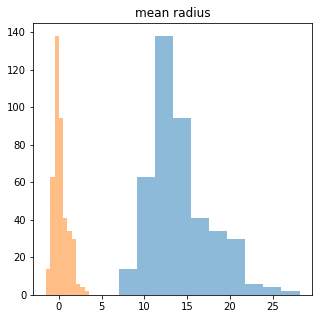

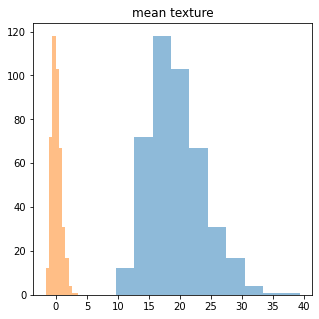

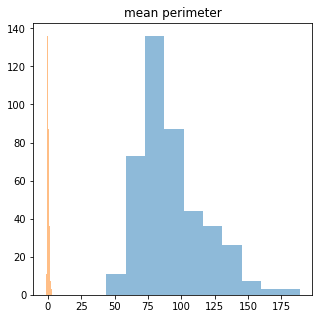

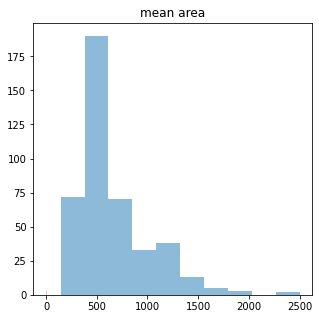

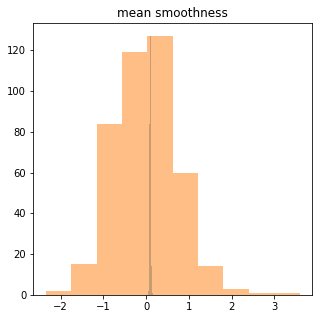

...

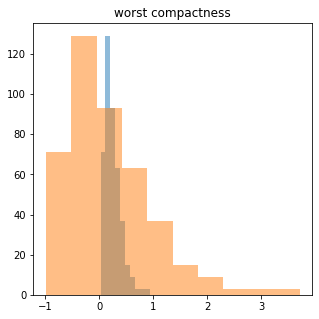

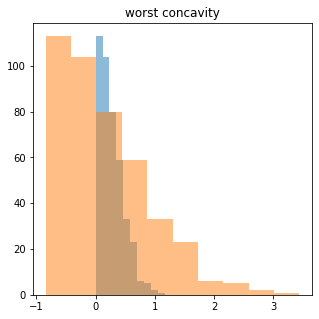

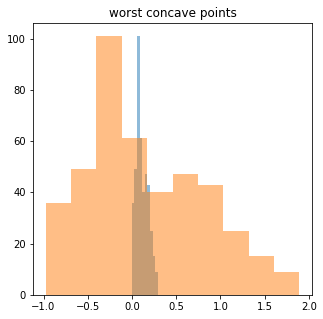

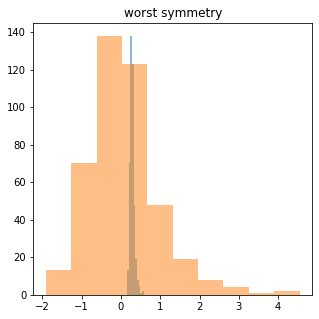

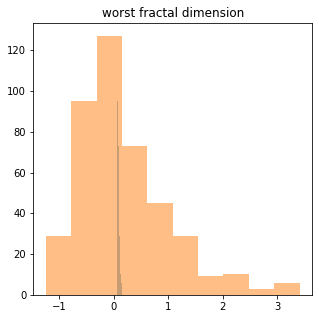

In [ ]:
# transform data
X_train_scaled = scaler.transform(X_train)
# print dataset properties before and after scaling
print("transformed shape: {}".format(X_train_scaled.shape))
print("per-feature minimum before scaling:\n {}".format(X_train.min(axis=0)))
print("per-feature maximum before scaling:\n {}".format(X_train.max(axis=0)))
print("per-feature minimum after scaling:\n {}".format(
    X_train_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n {}".format(
    X_train_scaled.max(axis=0)))

print(cancer.feature_names)
plt.rcParams['figure.figsize'] = [5, 5]
for idx, x in enumerate(cancer.feature_names):
    plt.figure()
    plt.title(x)
    plt.hist(X_train[:,idx], alpha=0.5)
    plt.hist(X_train_scaled[:,idx], alpha=0.5)


In [ ]:
# transform test data
X_test_scaled = scaler.transform(X_test)
# print test data properties after scaling
print("per-feature minimum after scaling:\n{}".format(X_test_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n{}".format(X_test_scaled.max(axis=0)))

per-feature minimum after scaling:
[-1.33071429 -1.4973357  -1.28655369 -0.99793016 -1.5087108  -1.01500155
 -0.59360951 -0.62128405 -1.31696086 -1.47943485 -0.80353782 -1.05173125
 -0.8231738  -0.63058226 -1.15551446 -0.8144508  -0.94088275 -1.51178301
 -1.23001982 -0.91696284 -1.05418803 -1.24900512 -1.01789976 -0.81281891
 -1.60954128 -0.85952074 -0.84110441 -0.97458901 -1.91104294 -1.25270623]
per-feature maximum after scaling:
[3.31904762 2.6642984  3.26969258 4.55618615 2.46984723 3.84488092
 3.03572292 2.84094575 3.41366078 4.48351648 3.63944298 2.28682898
 4.36663868 4.86450209 3.27420982 3.89806593 9.89460544 3.03314294
 6.82073067 3.87054389 3.12393162 1.88686754 2.95131265 4.54462447
 2.86972477 4.32826591 3.73742915 1.67544919 5.8696319  6.3351997 ]


#Power transormer

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target,
                                                    random_state=1)
logreg = LogisticRegression( solver='liblinear').fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test, y_test)))

Training set score: 0.958
Test set score: 0.951


In [ ]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()
pt.fit(X_train)
X_train_scaled=pt.transform(X_train)
X_test_scaled=pt.transform(X_test)
logreg = LogisticRegression( solver='liblinear').fit(X_train_scaled, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train_scaled, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test_scaled, y_test)))

Training set score: 0.991
Test set score: 0.965


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
logreg = LogisticRegression( solver='liblinear').fit(X_train_scaled, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train_scaled, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test_scaled, y_test)))

Training set score: 0.991
Test set score: 0.979


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
logreg = LogisticRegression( solver='liblinear').fit(X_train_scaled, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train_scaled, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test_scaled, y_test)))

Training set score: 0.962
Test set score: 0.958


In [ ]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
logreg = LogisticRegression( solver='liblinear').fit(X_train_scaled, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train_scaled, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test_scaled, y_test)))

Training set score: 0.991
Test set score: 0.965


In [ ]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()
X_train_to_pt=X_train[:,[0,3,4,7,9]]
X_test_to_pt=X_test[:,[0,3,4,7,9]]
pt.fit(X_train_to_pt)
X_train_to_pt=pt.transform(X_train_to_pt)
X_test_to_pt=pt.transform(X_test_to_pt)
X_train_scaled[:,[0,3,4,7,9]]=X_train_to_pt
X_test_scaled[:,[0,3,4,7,9]]=X_test_to_pt
logreg = LogisticRegression( solver='liblinear').fit(X_train_scaled, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train_scaled, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_test_scaled, y_test)))



Training set score: 0.991
Test set score: 0.979


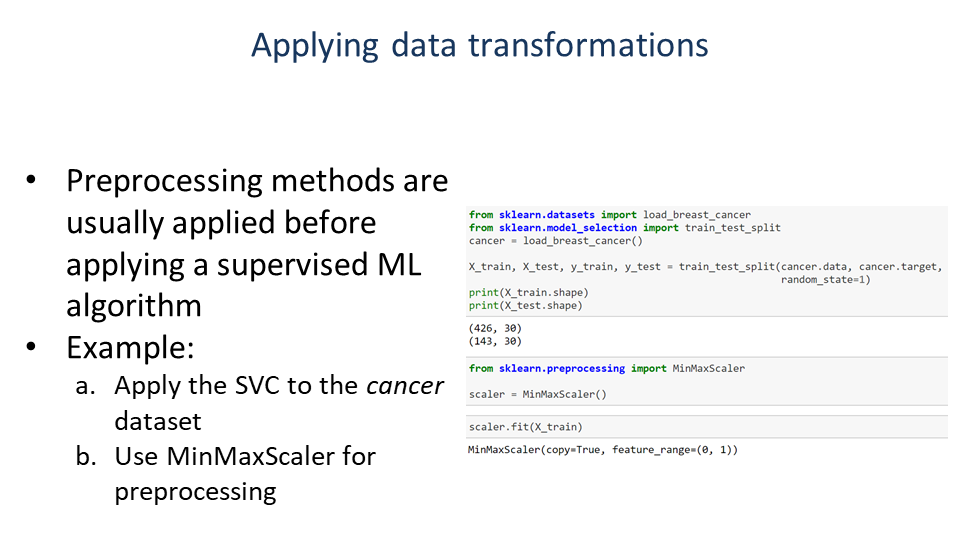

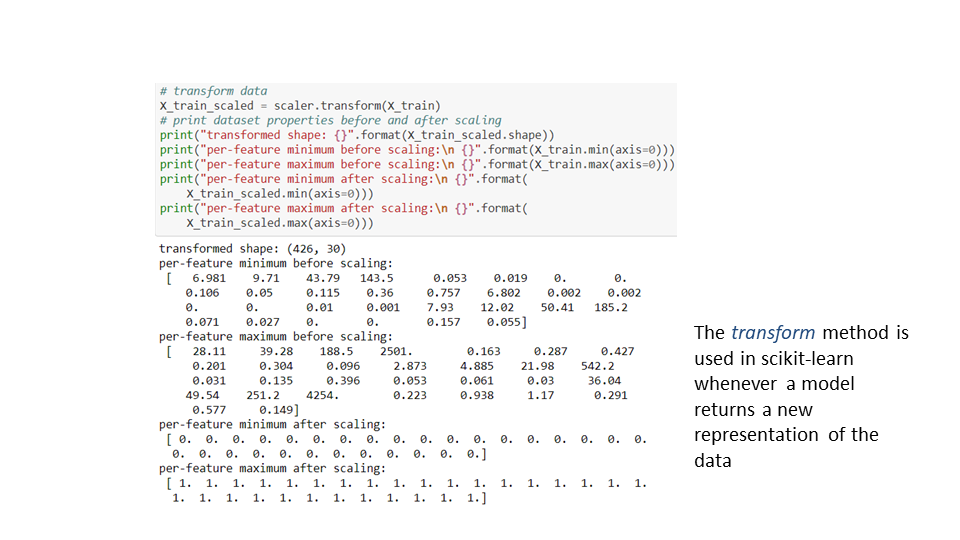

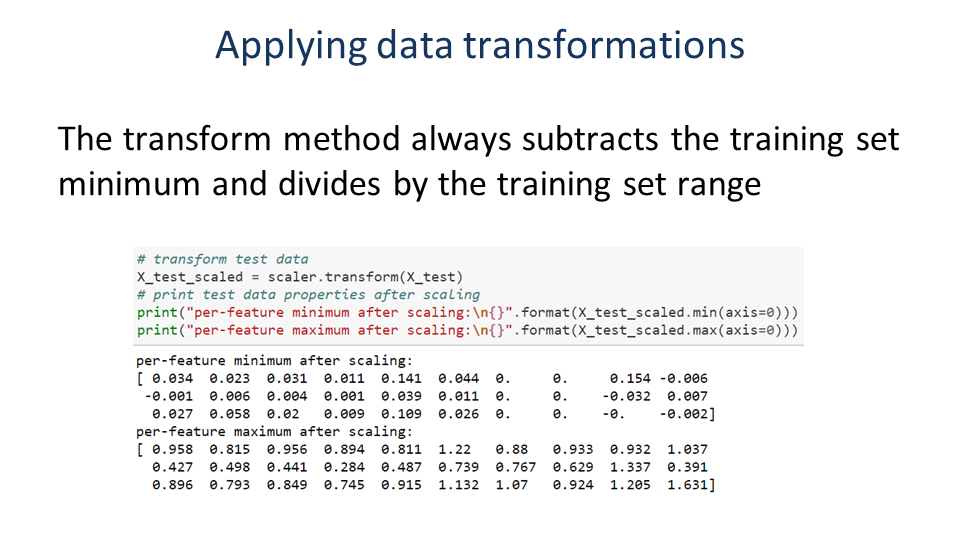

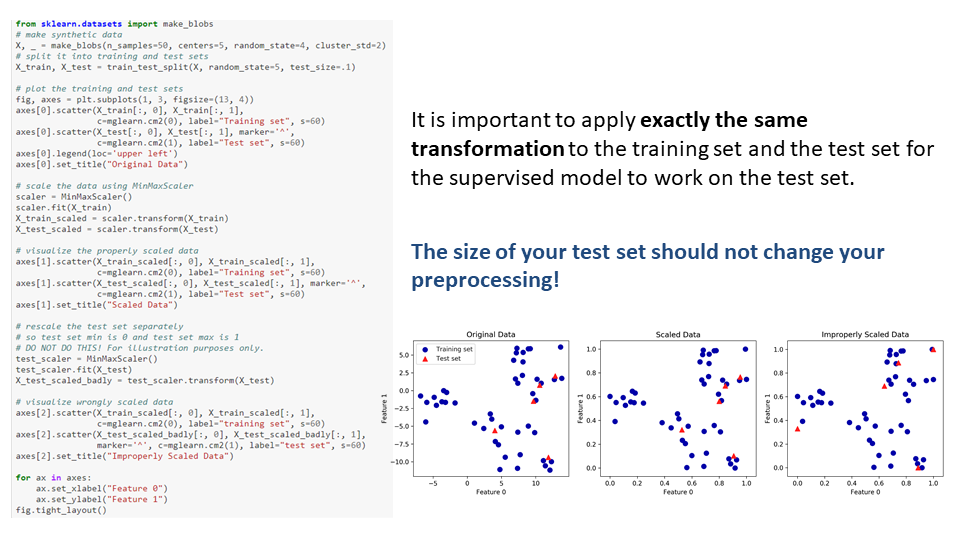

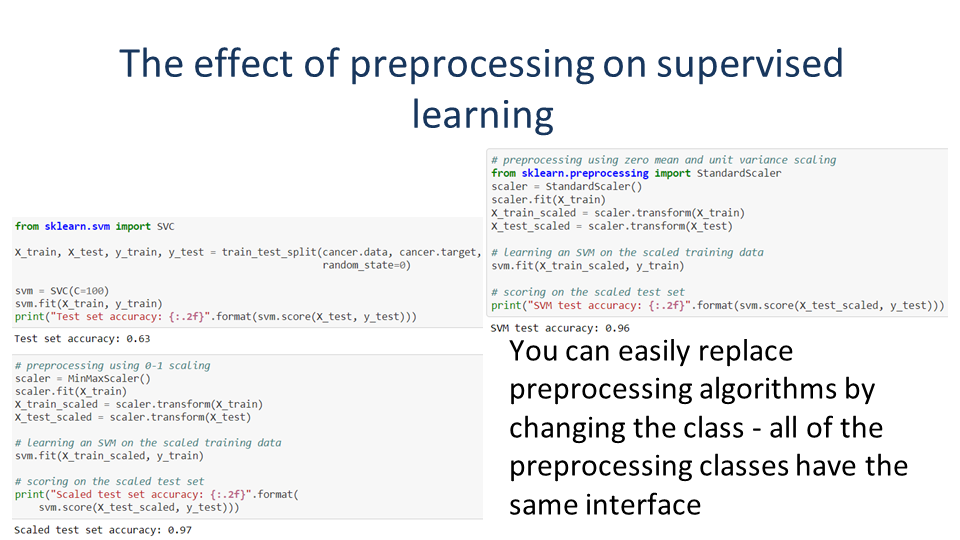

#Scaling Training and Test Data the Same Way

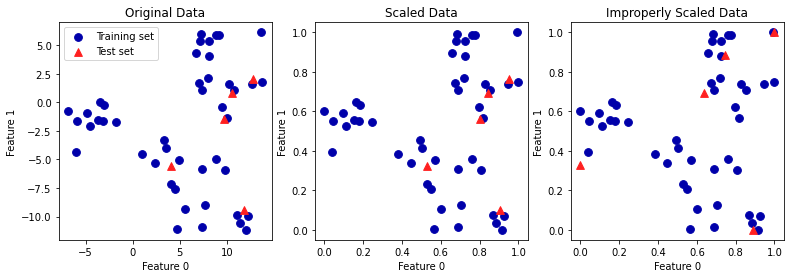

In [ ]:
from sklearn.datasets import make_blobs
# make synthetic data
X, _ = make_blobs(n_samples=50, centers=5, random_state=4, cluster_std=2)
# split it into training and test sets
X_train, X_test = train_test_split(X, random_state=5, test_size=.1)

# plot the training and test sets
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].scatter(X_train[:, 0], X_train[:, 1],
                c=mglearn.cm2(0), label="Training set", s=60)
axes[0].scatter(X_test[:, 0], X_test[:, 1], marker='^',
                c=mglearn.cm2(1), label="Test set", s=60)
axes[0].legend(loc='upper left')
axes[0].set_title("Original Data")

# scale the data using MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# visualize the properly scaled data
axes[1].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
                c=mglearn.cm2(0), label="Training set", s=60)
axes[1].scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], marker='^',
                c=mglearn.cm2(1), label="Test set", s=60)
axes[1].set_title("Scaled Data")

# rescale the test set separately
# so test set min is 0 and test set max is 1
# DO NOT DO THIS! For illustration purposes only.
test_scaler = MinMaxScaler()
test_scaler.fit(X_test)
X_test_scaled_badly = test_scaler.transform(X_test)

# visualize wrongly scaled data
axes[2].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
                c=mglearn.cm2(0), label="training set", s=60)
axes[2].scatter(X_test_scaled_badly[:, 0], X_test_scaled_badly[:, 1],
                marker='^', c=mglearn.cm2(1), label="test set", s=60)
axes[2].set_title("Improperly Scaled Data")

for ax in axes:
    ax.set_xlabel("Feature 0")
    ax.set_ylabel("Feature 1")

Often, you want to fit a model on some dataset, and then transform it. This is a very
common task, which can often be computed more efficiently than by simply calling
fit and then transform. For this use case, all models that have a transform method
also have a fit_transform method. Here is an example using StandardScaler:

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# calling fit and transform in sequence (using method chaining)
X_scaled = scaler.fit(X).transform(X)
# same result, but more efficient computation
X_scaled_d = scaler.fit_transform(X)

#Univariate nonlinear transformations

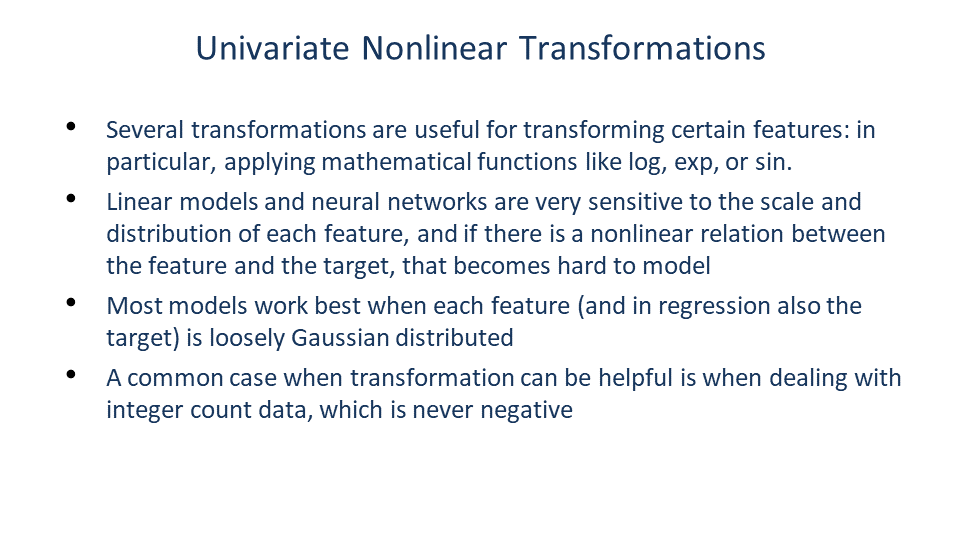

In [ ]:
rnd = np.random.RandomState(0)
X_org = rnd.normal(size=(1000, 3))
w = rnd.normal(size=3)
X = rnd.poisson(10 * np.exp(X_org))
y = np.dot(X_org, w)


In [ ]:
print("Number of feature appearances:\n{}".format(np.bincount(X[:, 0])))

Number of feature appearances:
[28 38 68 48 61 59 45 56 37 40 35 34 36 26 23 26 27 21 23 23 18 21 10  9
 17  9  7 14 12  7  3  8  4  5  5  3  4  2  4  1  1  3  2  5  3  8  2  5
  2  1  2  3  3  2  2  3  3  0  1  2  1  0  0  3  1  0  0  0  1  3  0  1
  0  2  0  1  1  0  0  0  0  1  0  0  2  2  0  1  1  0  0  0  0  1  1  0
  0  0  0  0  0  0  1  0  0  0  0  0  1  1  0  0  1  0  0  0  0  0  0  0
  1  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1]


In [ ]:
np.bincount(X[:, 0]).shape

(141,)

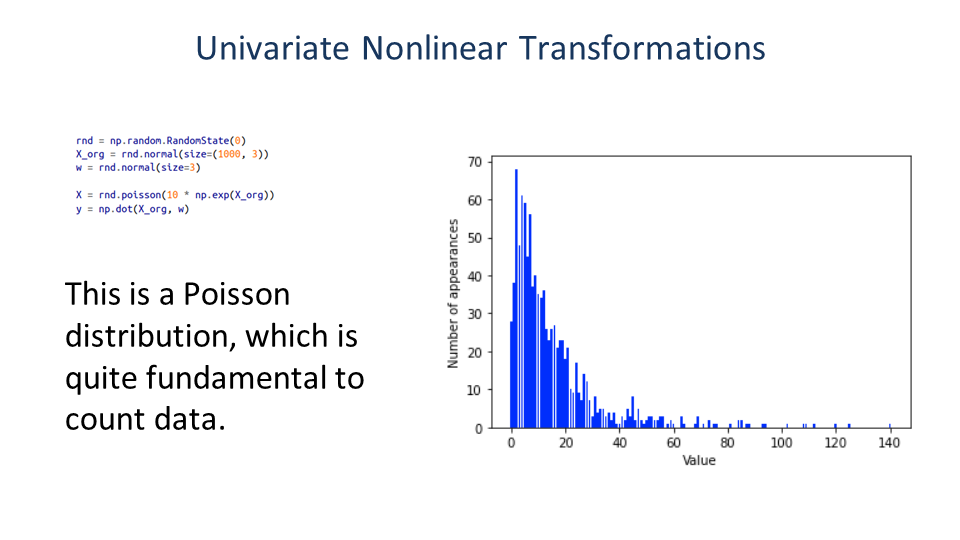

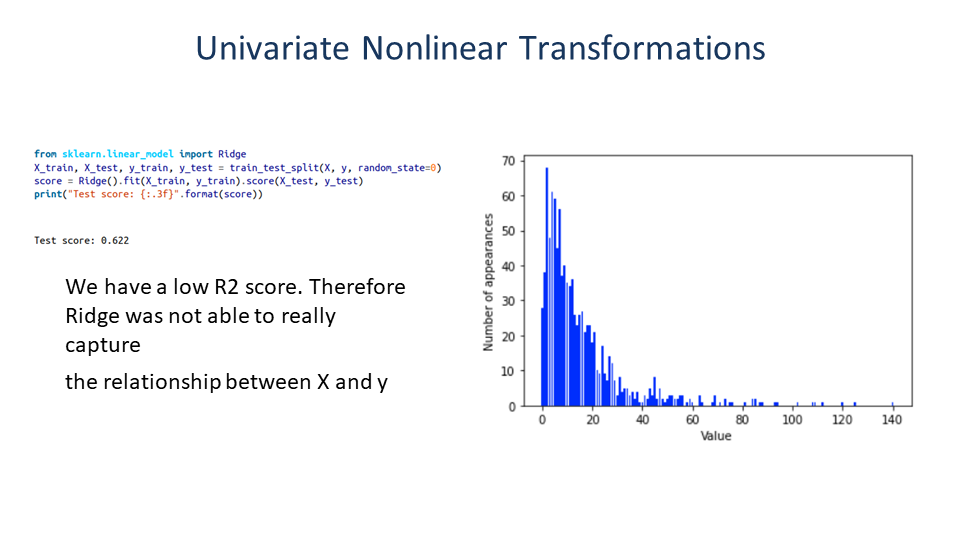

Text(0.5, 0, 'Value')

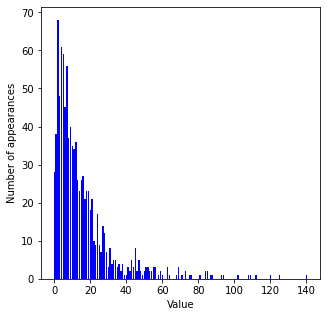

In [ ]:
bins = np.bincount(X[:, 0])
plt.bar(range(len(bins)), bins, color='b')
plt.ylabel("Number of appearances")
plt.xlabel("Value")

In [ ]:
print(min(X[:, 0]))
print(max(X[:, 0]))
print(bins.shape)

0
140
(141,)


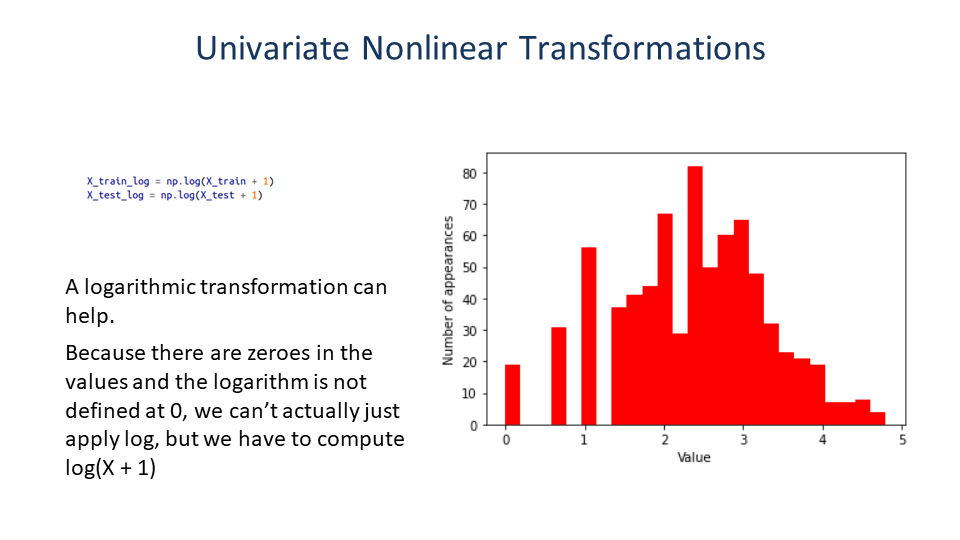

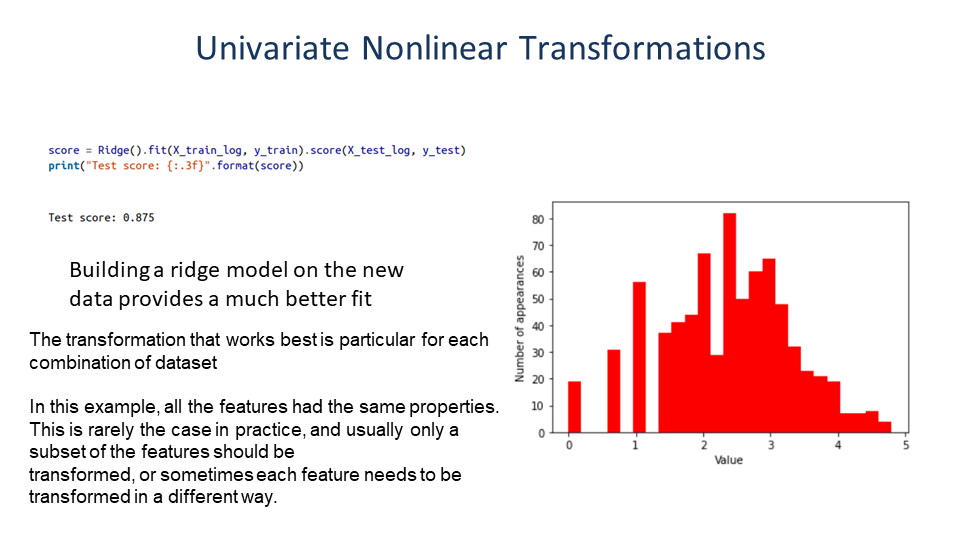

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
score = Ridge().fit(X_train, y_train).score(X_test, y_test)
print("Test score: {:.3f}".format(score))

Test score: 0.622


In [ ]:
X_train_log = np.log(X_train + 1)
X_test_log = np.log(X_test + 1)

Text(0.5, 0, 'Value')

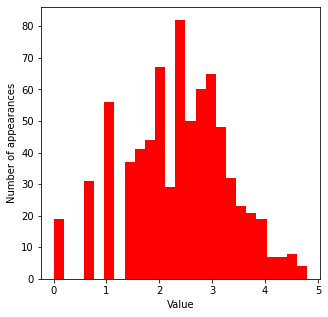

In [ ]:
plt.hist(X_train_log[:, 0], bins=25, color='r')
plt.ylabel("Number of appearances")
plt.xlabel("Value")

In [ ]:
score = Ridge().fit(X_train_log, y_train).score(X_test_log, y_test)
print("Test score: {:.3f}".format(score))

Test score: 0.875


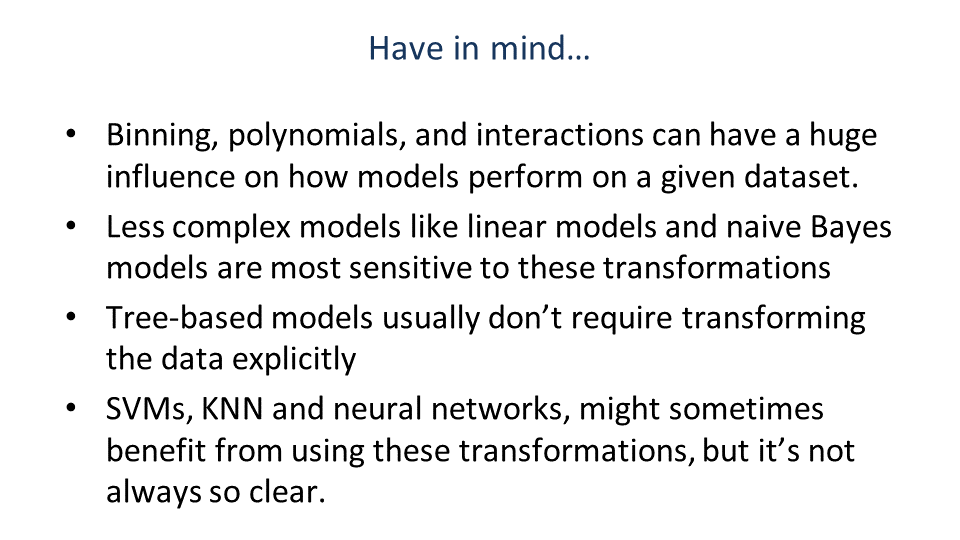

#Encoding of categorical data

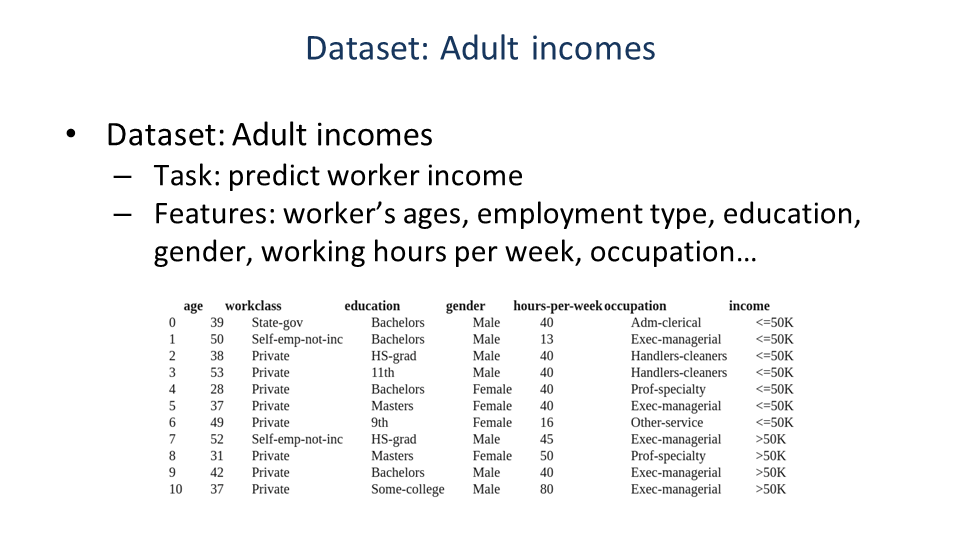

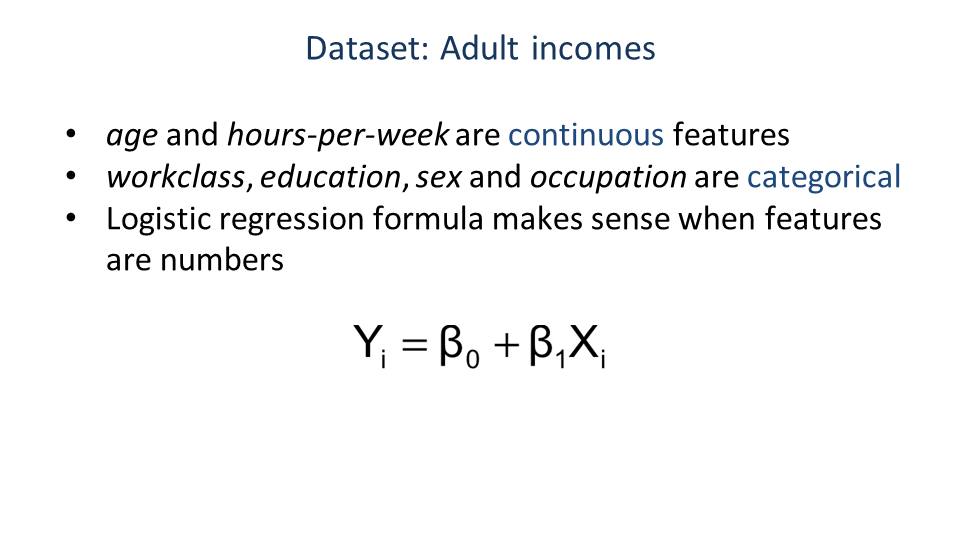

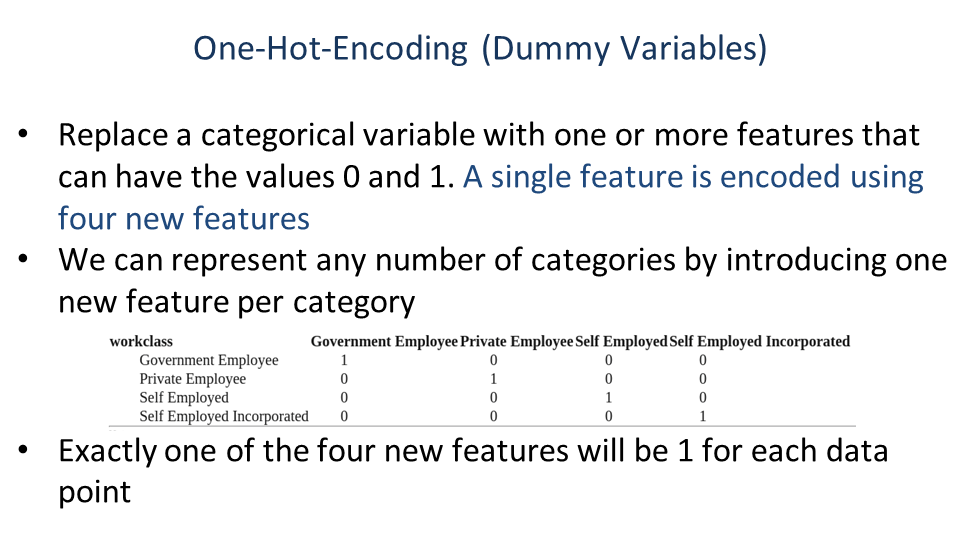

In [ ]:
import pandas as pd
# The file has no headers naming the columns, so we pass header=None
# and provide the column names explicitly in "names"
url="https://raw.githubusercontent.com/profandresg/pyzero/main/adult.data"
data = pd.read_csv(url, header=None, index_col=False,
    names=['age', 'workclass', 'fnlwgt', 'education',  'education-num',
           'marital-status', 'occupation', 'relationship', 'race', 'gender',
           'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
           'income'])
# For illustration purposes, we only select some of the columns
data = data[['age', 'workclass', 'education', 'gender', 'hours-per-week',
             'occupation', 'income']]
# IPython.display allows nice output formatting within the Jupyter notebook
display(data.head())

,age,workclass,education,gender,hours-per-week,occupation,income
0,39,State-gov,Bachelors,Male,40,Adm-clerical,<=50K
1,50,Self-emp-not-inc,Bachelors,Male,13,Exec-managerial,<=50K
2,38,Private,HS-grad,Male,40,Handlers-cleaners,<=50K
3,53,Private,11th,Male,40,Handlers-cleaners,<=50K
4,28,Private,Bachelors,Female,40,Prof-specialty,<=50K


In [ ]:
print(data.gender.value_counts())

 Male      21790
 Female    10771
Name: gender, dtype: int64


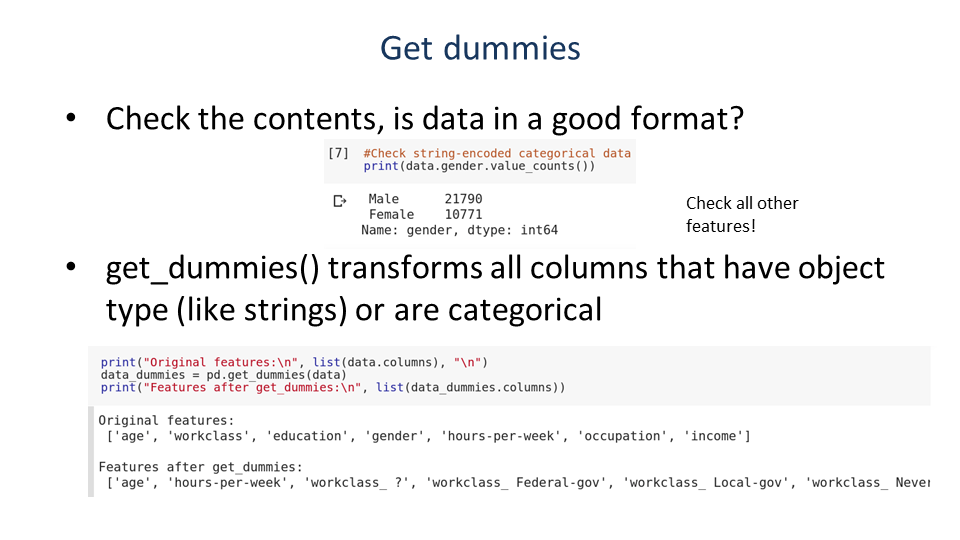

In [ ]:
print("Original features:\n", list(data.columns), "\n")
data_dummies = pd.get_dummies(data)
print("Features after get_dummies:\n", list(data_dummies.columns))

Original features:
 ['age', 'workclass', 'education', 'gender', 'hours-per-week', 'occupation', 'income'] 

Features after get_dummies:
 ['age', 'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'gender_ Female', 'gender_ Male', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-i

In [ ]:
data_dummies.head()

,age,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,gender_ Female,gender_ Male,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,income_ <=50K,income_ >50K
0,39,40,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,50,13,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
2,38,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
3,53,40,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,28,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


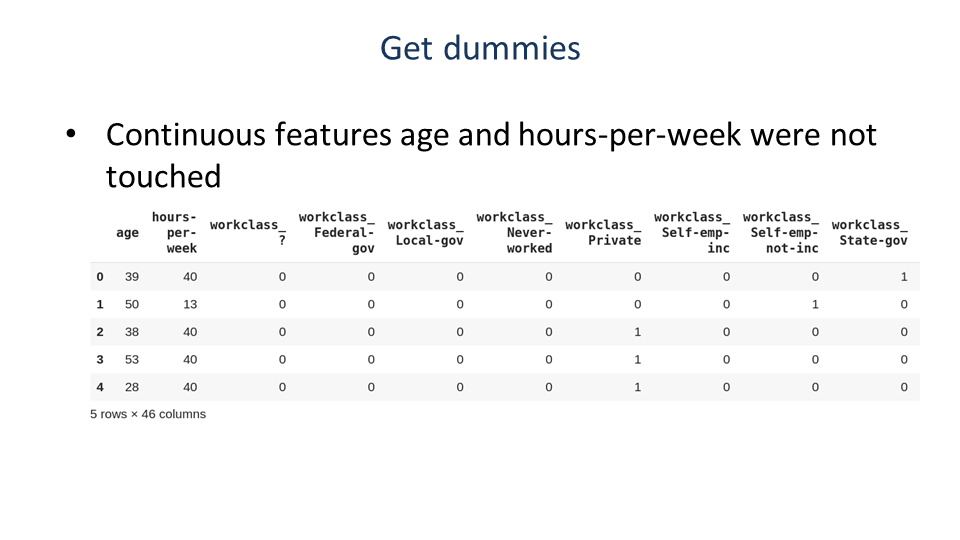

In [ ]:
features = data_dummies.loc[:, 'age':'occupation_ Transport-moving']
# Extract NumPy arrays
X = features.values
y = data_dummies['income_ >50K'].values
print("X.shape: {}  y.shape: {}".format(X.shape, y.shape))

X.shape: (32561, 44)  y.shape: (32561,)


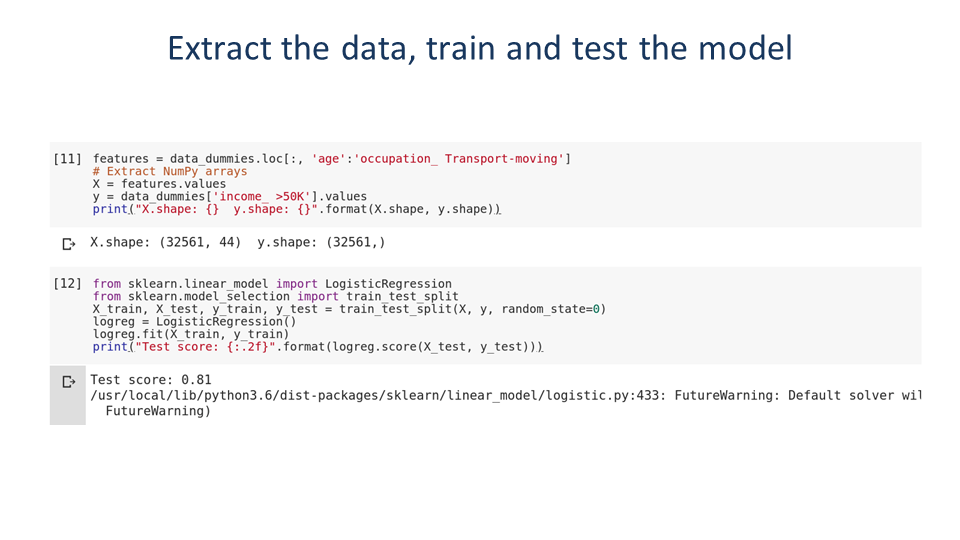

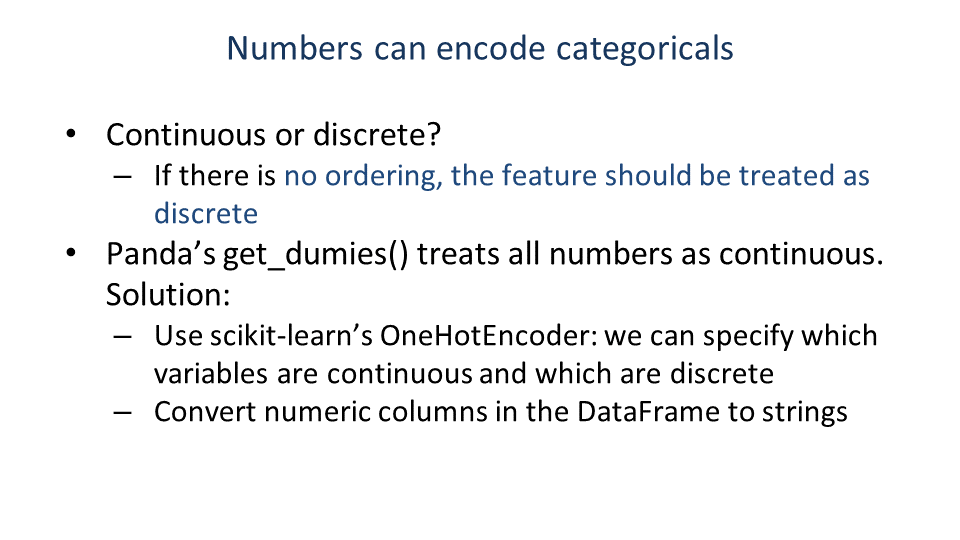

In [ ]:
# create a DataFrame with an integer feature and a categorical string feature
demo_df = pd.DataFrame({'Integer Feature': [0, 1, 2, 1],
                        'Categorical Feature': ['socks', 'fox', 'socks', 'box']})
display(demo_df)

,Integer Feature,Categorical Feature
0,0,socks
1,1,fox
2,2,socks
3,1,box


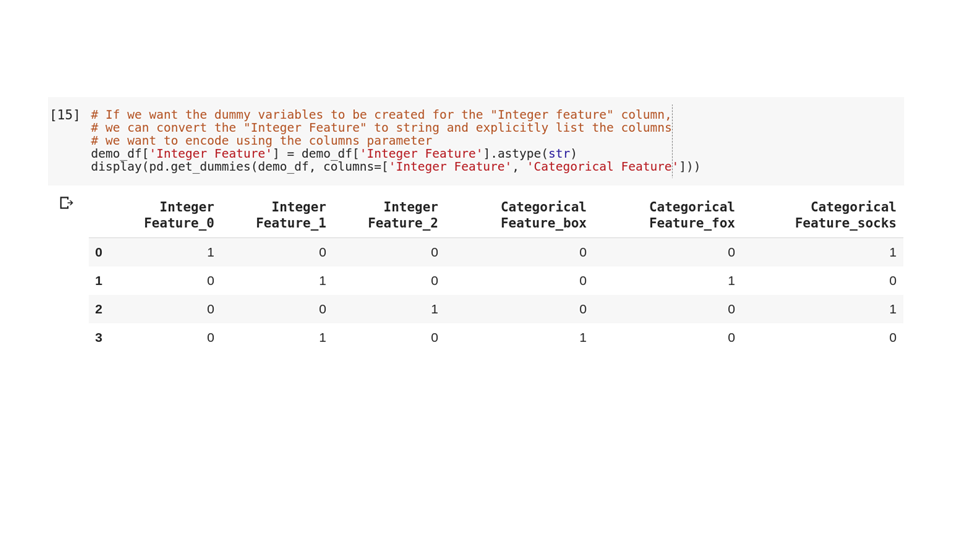

In [ ]:
pd.get_dummies(demo_df)

,Integer Feature,Categorical Feature_box,Categorical Feature_fox,Categorical Feature_socks
0,0,0,0,1
1,1,0,1,0
2,2,0,0,1
3,1,1,0,0


In [ ]:
demo_df['Integer Feature'] = demo_df['Integer Feature'].astype(str)
pd.get_dummies(demo_df, columns=['Integer Feature', 'Categorical Feature'])

,Integer Feature_0,Integer Feature_1,Integer Feature_2,Categorical Feature_box,Categorical Feature_fox,Categorical Feature_socks
0,1,0,0,0,0,1
1,0,1,0,0,1,0
2,0,0,1,0,0,1
3,0,1,0,1,0,0


#Feature Augmentation for linear models: Binning, Interactions and Polynomials

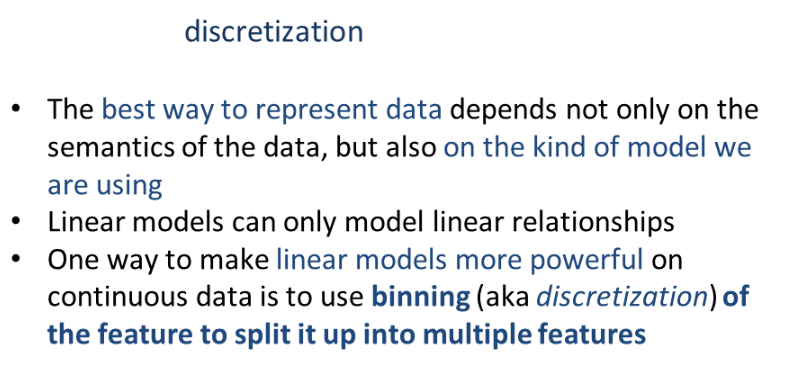

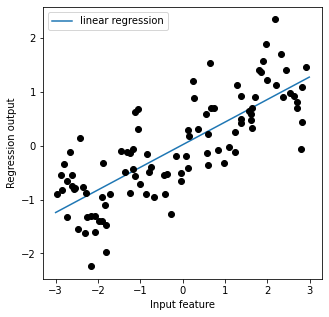

In [ ]:
from sklearn.linear_model import LinearRegression

X, y = mglearn.datasets.make_wave(n_samples=100)
line = np.linspace(-3, 3, 1000, endpoint=False).reshape(-1, 1)

reg = LinearRegression().fit(X, y)
plt.plot(line, reg.predict(line), label="linear regression")

plt.plot(X[:, 0], y, 'o', c='k')
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.legend(loc="best")

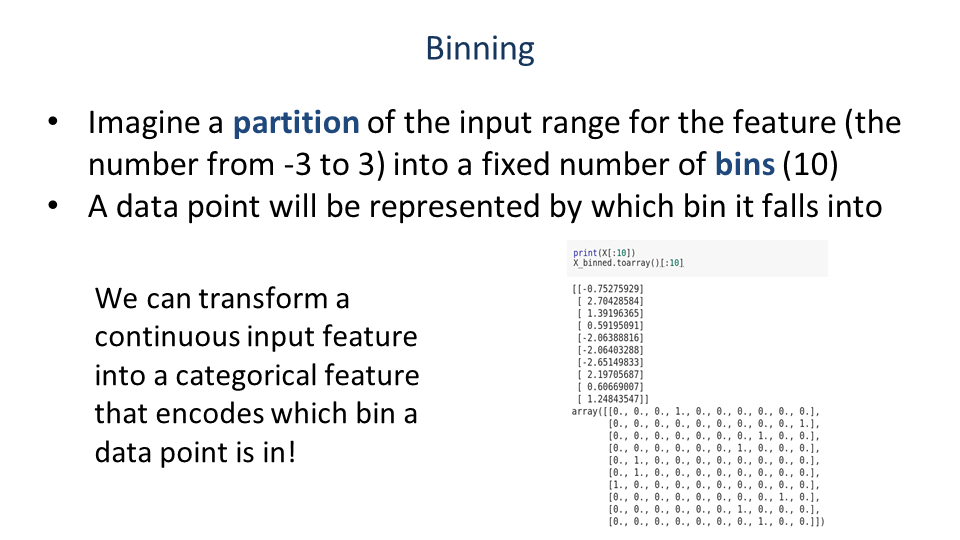

In [ ]:
bins = np.linspace(-3, 3, 11)
print("bins: {}".format(bins))

bins: [-3.  -2.4 -1.8 -1.2 -0.6  0.   0.6  1.2  1.8  2.4  3. ]


In [ ]:
which_bin = np.digitize(X, bins=bins)
print("\nData points:\n", X[:5])
print("\nBin membership for data points:\n", which_bin[:5])


Data points:
 [[-0.75275929]
 [ 2.70428584]
 [ 1.39196365]
 [ 0.59195091]
 [-2.06388816]]

Bin membership for data points:
 [[ 4]
 [10]
 [ 8]
 [ 6]
 [ 2]]


In [ ]:
from sklearn.preprocessing import OneHotEncoder
# transform using the OneHotEncoder
encoder = OneHotEncoder(sparse=False)
# encoder.fit finds the unique values that appear in which_bin
encoder.fit(which_bin)
# transform creates the one-hot encoding
X_binned = encoder.transform(which_bin)
line_binned = encoder.transform(np.digitize(line, bins=bins))
print(X_binned[:5])

[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
print("X_binned.shape: {}".format(X_binned.shape))
print("line_binned.shape: {}".format(line_binned.shape))

X_binned.shape: (100, 10)
line_binned.shape: (1000, 10)


Text(0.5, 0, 'Input feature')

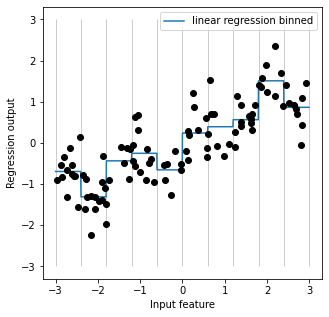

In [ ]:
reg = LinearRegression().fit(X_binned, y)
plt.plot(line, reg.predict(line_binned), label='linear regression binned')
plt.plot(X[:, 0], y, 'o', c='k')
plt.vlines(bins, -3, 3, linewidth=1, alpha=.2)
plt.legend(loc="best")
plt.ylabel("Regression output")
plt.xlabel("Input feature")

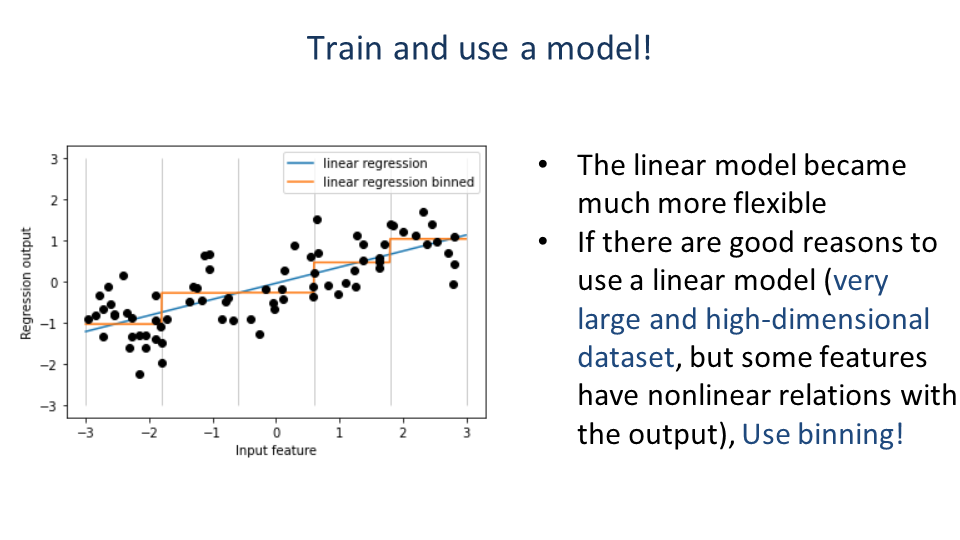

#Interactions and Polynomials

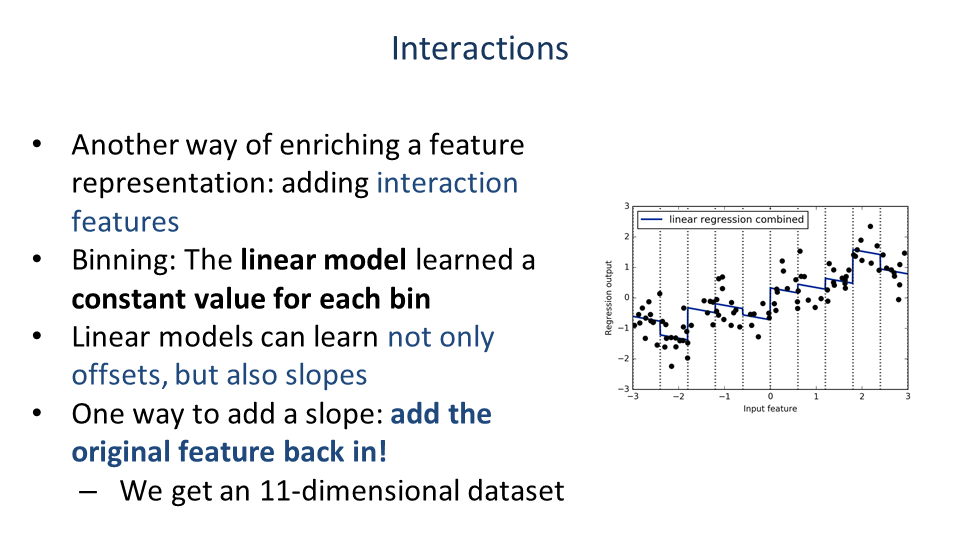

In [ ]:
X_combined = np.hstack([X, X_binned])
line_combined = np.hstack([line, line_binned])
print(X_combined.shape)

(100, 11)


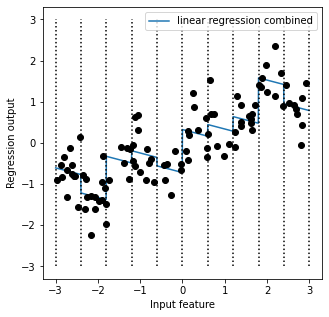

In [ ]:
reg = LinearRegression().fit(X_combined, y)

plt.plot(line, reg.predict(line_combined), label='linear regression combined')

for bin in bins:
    plt.plot([bin, bin], [-3, 3], ':', c='k')
    plt.legend(loc="best")
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.plot(X[:, 0], y, 'o', c='k')

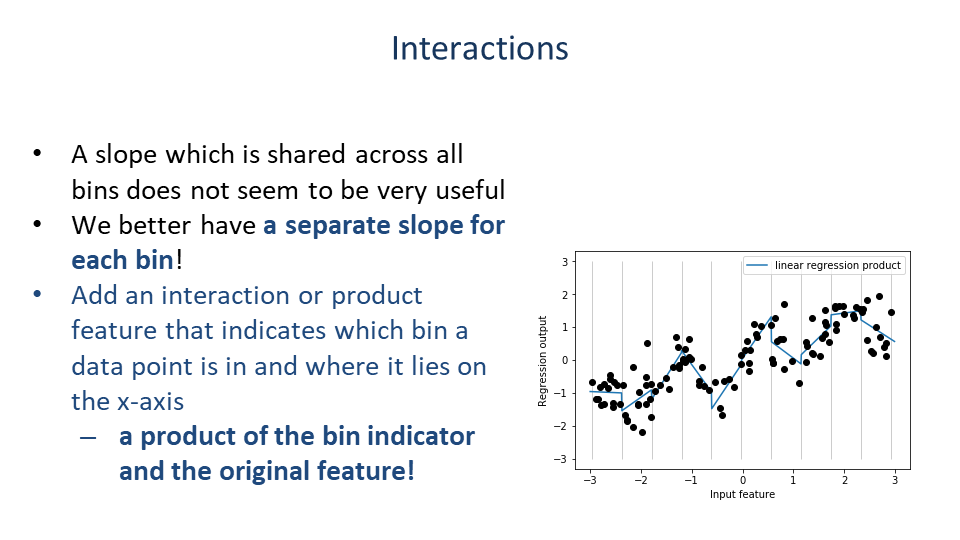

In [ ]:
X_product = np.hstack([X_binned, X * X_binned])
line_product = np.hstack([line_binned, line * line_binned])
print(X_product.shape)

(100, 20)


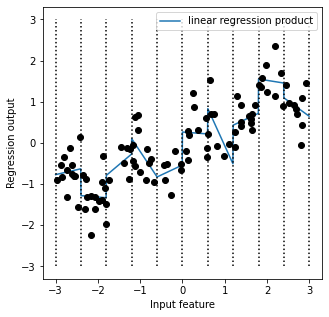

In [ ]:
reg = LinearRegression().fit(X_product, y)
plt.plot(line, reg.predict(line_product), label='linear regression product')

for bin in bins:
    plt.plot([bin, bin], [-3, 3], ':', c='k')

plt.plot(X[:, 0], y, 'o', c='k')
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.legend(loc="best")

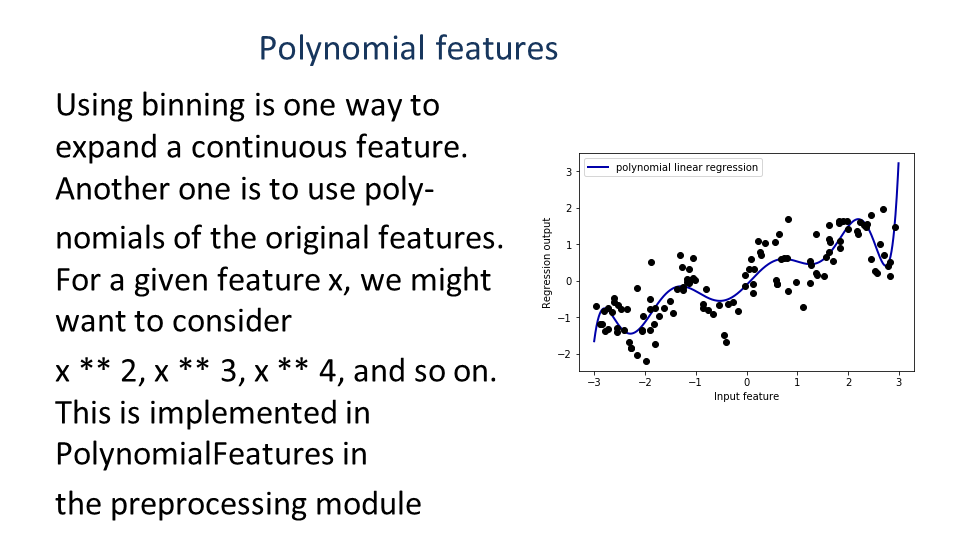

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

# include polynomials up to x ** 10:
# the default "include_bias=True" adds a feature that's constantly 1
poly = PolynomialFeatures(degree=10, include_bias=False)
poly.fit(X)
X_poly = poly.transform(X)
line_poly=poly.transform(line)

In [ ]:
print("X_poly.shape: {}".format(X_poly.shape))

X_poly.shape: (100, 10)


In [ ]:
print("Entries of X:\n{}".format(X[:5]))
print("Entries of X_poly:\n{}".format(X_poly[:5]))

Entries of X:
[[-0.75275929]
 [ 2.70428584]
 [ 1.39196365]
 [ 0.59195091]
 [-2.06388816]]
Entries of X_poly:
[[-7.52759287e-01  5.66646544e-01 -4.26548448e-01  3.21088306e-01
  -2.41702204e-01  1.81943579e-01 -1.36959719e-01  1.03097700e-01
  -7.76077513e-02  5.84199555e-02]
 [ 2.70428584e+00  7.31316190e+00  1.97768801e+01  5.34823369e+01
   1.44631526e+02  3.91124988e+02  1.05771377e+03  2.86036036e+03
   7.73523202e+03  2.09182784e+04]
 [ 1.39196365e+00  1.93756281e+00  2.69701700e+00  3.75414962e+00
   5.22563982e+00  7.27390068e+00  1.01250053e+01  1.40936394e+01
   1.96178338e+01  2.73073115e+01]
 [ 5.91950905e-01  3.50405874e-01  2.07423074e-01  1.22784277e-01
   7.26822637e-02  4.30243318e-02  2.54682921e-02  1.50759786e-02
   8.92423917e-03  5.28271146e-03]
 [-2.06388816e+00  4.25963433e+00 -8.79140884e+00  1.81444846e+01
  -3.74481869e+01  7.72888694e+01 -1.59515582e+02  3.29222321e+02
  -6.79478050e+02  1.40236670e+03]]


In [ ]:
print("Polynomial feature names:\n{}".format(poly.get_feature_names()))

Polynomial feature names:
['x0', 'x0^2', 'x0^3', 'x0^4', 'x0^5', 'x0^6', 'x0^7', 'x0^8', 'x0^9', 'x0^10']


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


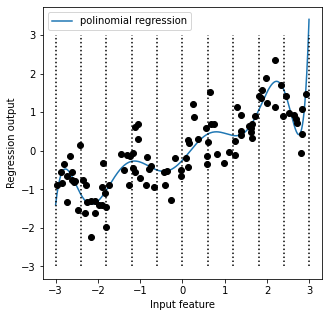

In [ ]:
reg = LinearRegression().fit(X_poly, y)
plt.plot(line, reg.predict(line_poly), label='polinomial regression')

for bin in bins:
    plt.plot([bin, bin], [-3, 3], ':', c='k')

plt.plot(X[:, 0], y, 'o', c='k')
plt.ylabel("Regression output")
plt.xlabel("Input feature")
plt.legend(loc="best")

#Feature Selection using Univariate Statistics

###Feature Selection using Univariate Statistics

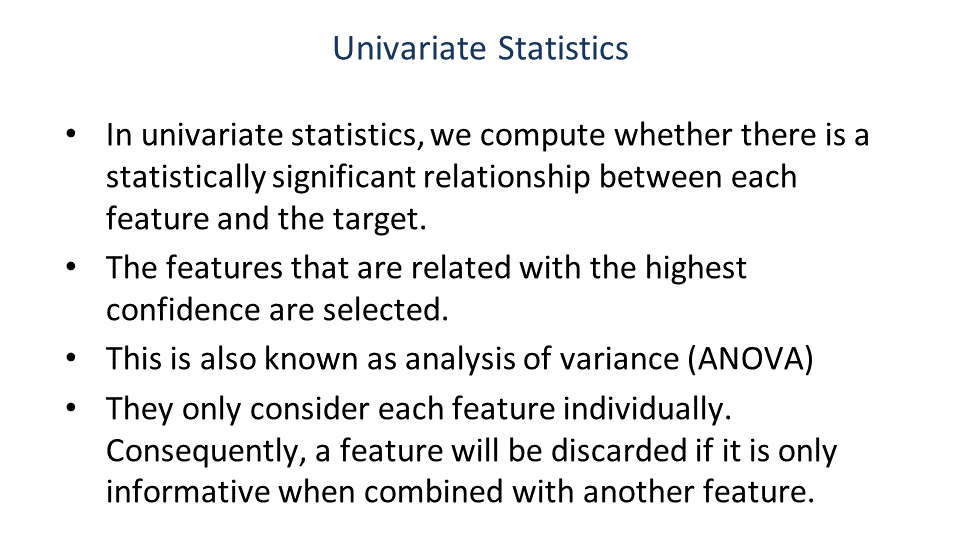

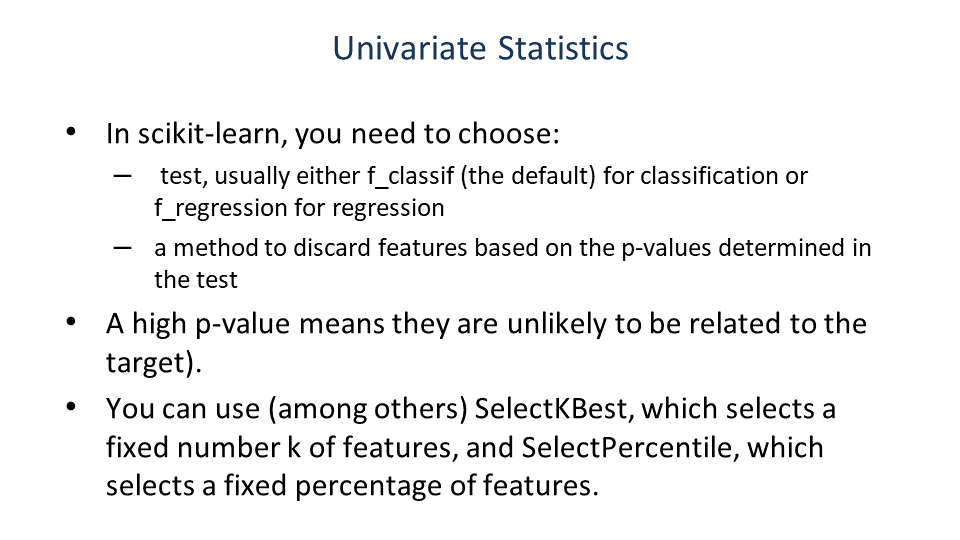

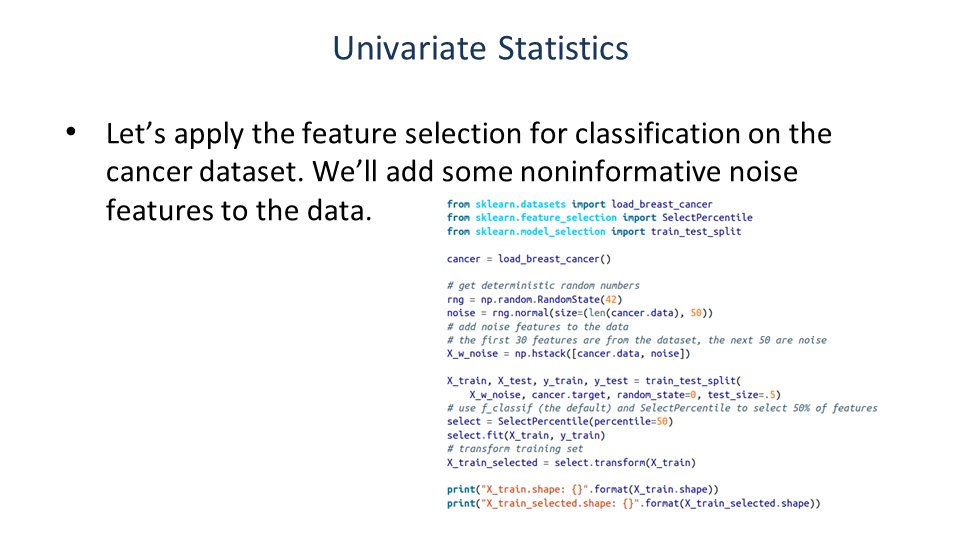

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.feature_selection import SelectPercentile
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()

# get deterministic random numbers
rng = np.random.RandomState(42)
noise = rng.normal(size=(len(cancer.data), 50))
# add noise features to the data
# the first 30 features are from the dataset, the next 50 are noise
X_w_noise = np.hstack([cancer.data, noise])

X_train, X_test, y_train, y_test = train_test_split(
    X_w_noise, cancer.target, random_state=0, test_size=.5)
# use f_classif (the default) and SelectPercentile to select 50% of features
select = SelectPercentile(percentile=5)
select.fit(X_train, y_train)
# transform training set
X_train_selected = select.transform(X_train)

print("X_train.shape: {}".format(X_train.shape))
print("X_train_selected.shape: {}".format(X_train_selected.shape))

X_train.shape: (284, 80)
X_train_selected.shape: (284, 4)


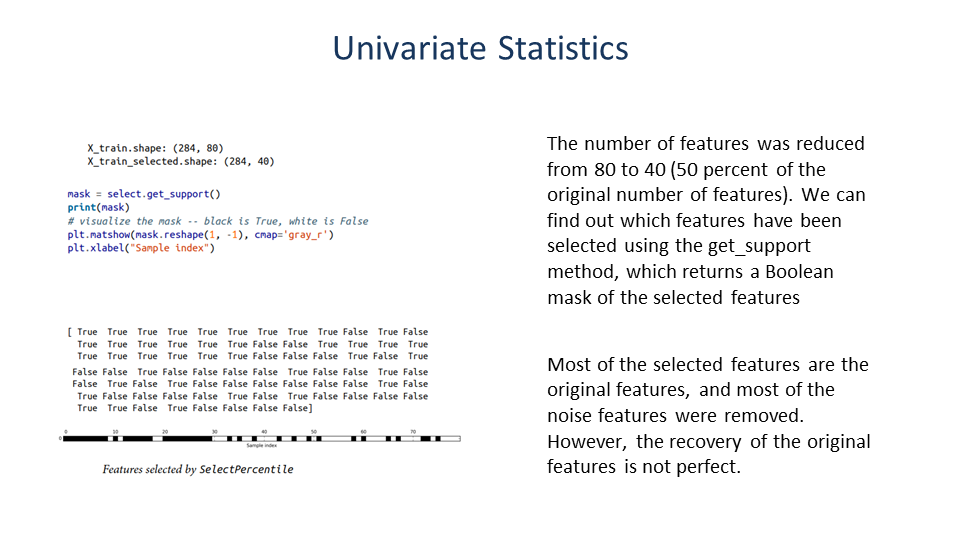

[False False False False False False False  True False False False False
 False False False False False False False False  True False  True False
 False False False  True False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False]


Text(0.5, 0, 'Sample index')

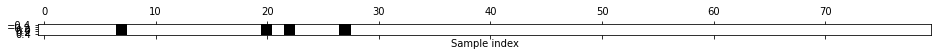

In [ ]:
mask = select.get_support()
print(mask)
# visualize the mask -- black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")

[2.87891478e+02 4.75857903e+01 3.10612785e+02 2.41276462e+02
 4.52640733e+01 1.69963025e+02 2.76369205e+02 4.42910141e+02
 3.53148760e+01 2.48339844e-01 1.14278701e+02 5.70579214e-01
 1.06724322e+02 9.10220232e+01 1.86834578e+00 1.68338460e+01
 9.09124140e+00 3.83019556e+01 2.14960839e-02 1.94090779e-01
 3.88608198e+02 6.36227382e+01 4.00380697e+02 2.81097472e+02
 7.08022342e+01 1.59204990e+02 2.42056413e+02 5.53000131e+02
 6.62873083e+01 3.03266462e+01 5.09796742e-01 2.19965073e-01
 2.81054688e-02 3.77480895e+00 5.89522779e-01 3.71661971e+00
 1.90263601e-02 2.01804626e-01 2.28670543e+00 4.46951210e-01
 7.81244165e-02 1.83974939e-01 5.60230622e-02 4.18386150e+00
 1.52965820e-01 3.77887289e-01 1.55740225e+00 1.41335016e+00
 1.30242498e-01 1.58331787e+00 8.81957793e-02 3.95307725e+00
 7.68258256e-02 1.10879240e+00 1.11481877e-02 3.55975928e-01
 2.16015641e-01 6.45761425e-01 3.05437654e+00 2.21520013e-01
 3.92860873e+00 8.15884138e-02 5.81255747e-01 1.20172727e+00
 2.04043714e-01 2.202537

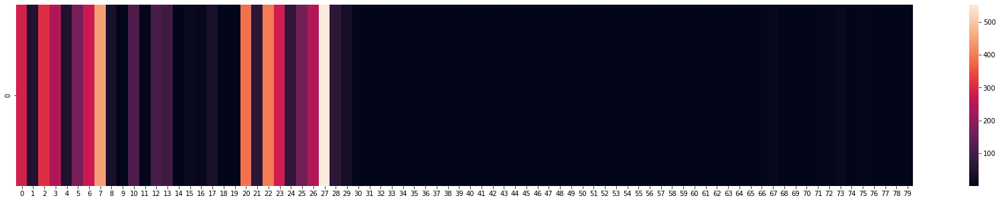

In [ ]:
plt.rcParams['figure.figsize'] = [30,5]
import seaborn as sns
print(select.scores_)
sns.heatmap(pd.DataFrame(select.scores_).transpose())

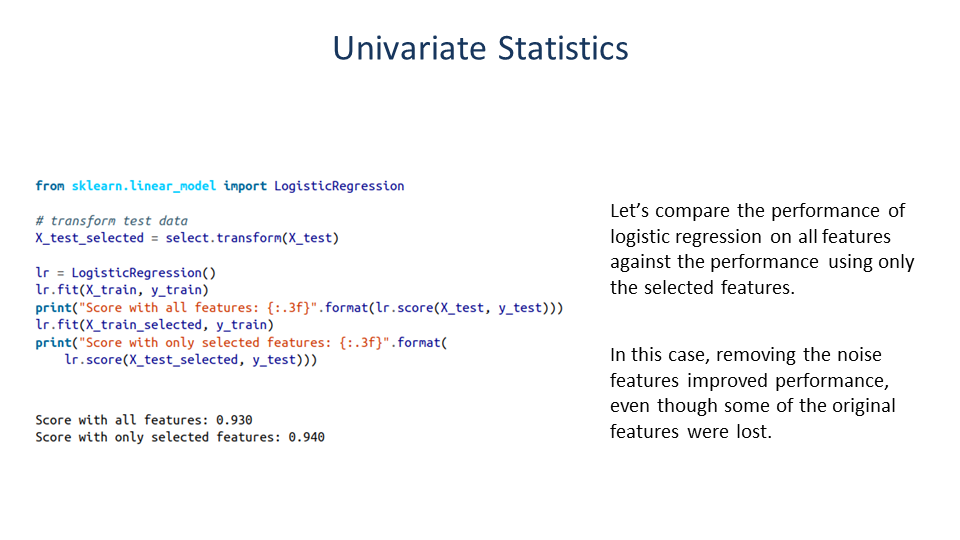

In [ ]:
# transform test data
X_test_selected = select.transform(X_test)

lr = LogisticRegression(max_iter=10000)
lr.fit(X_train, y_train)
print("Score with all features: {:.3f}".format(lr.score(X_test, y_test)))
lr.fit(X_train_selected, y_train)
print("Score with only selected features: {:.3f}".format(
    lr.score(X_test_selected, y_test)))

Score with all features: 0.951
Score with only selected features: 0.926


## Model-Based Feature Selection

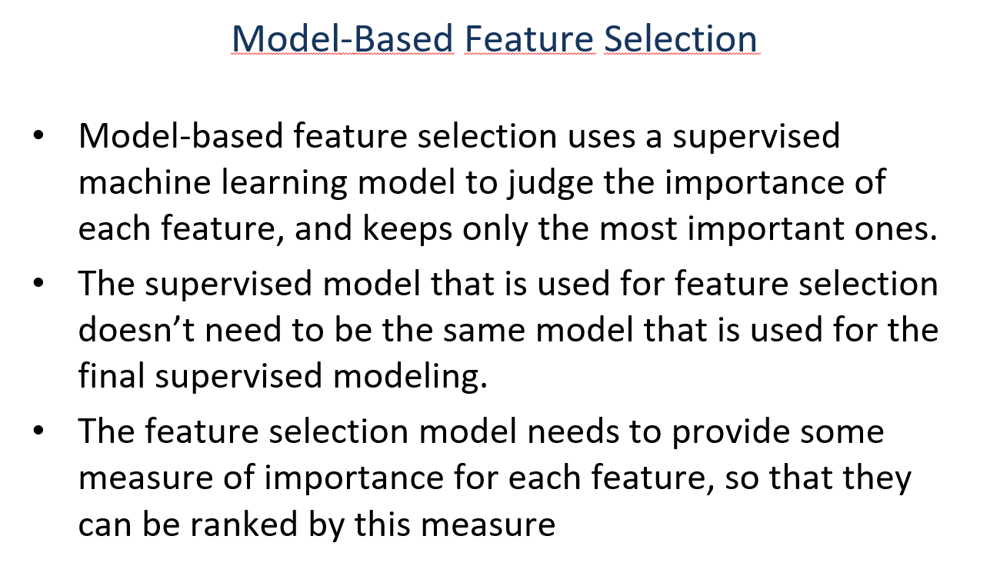

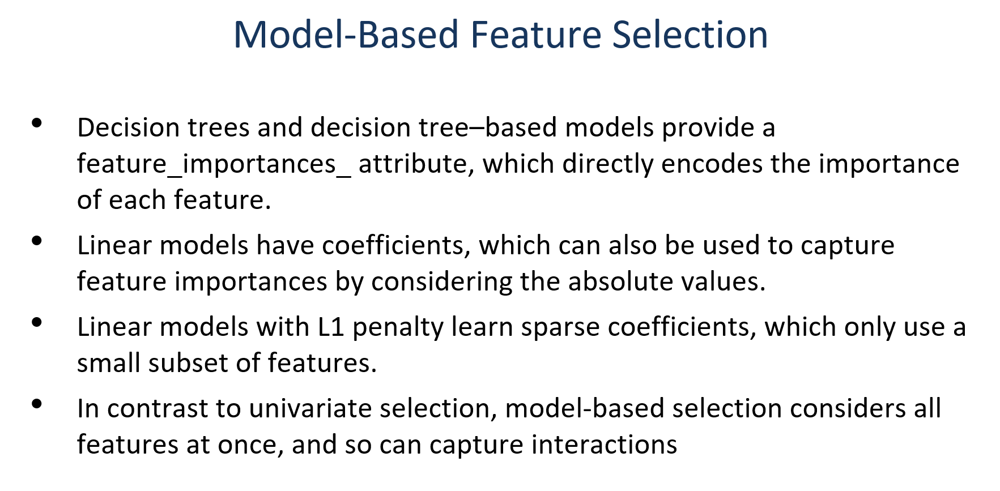

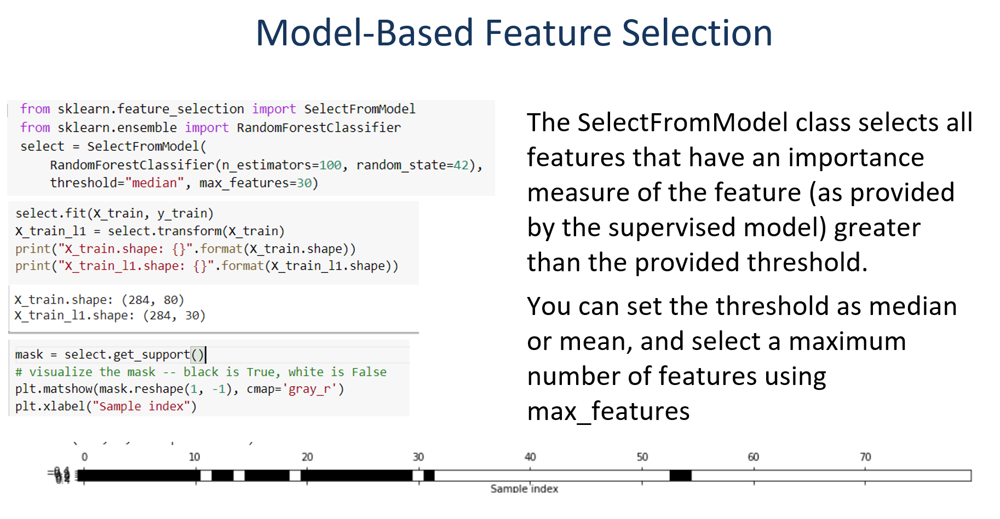

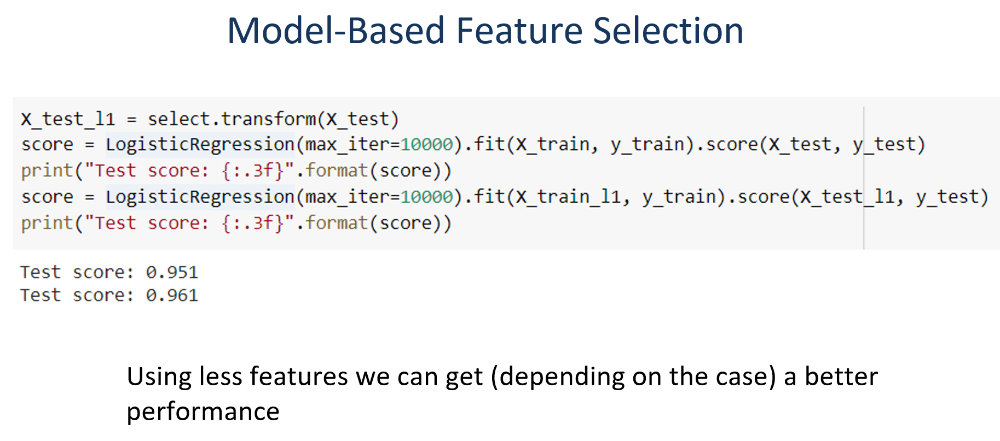

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import RidgeClassifier


select = SelectFromModel(RidgeClassifier(alpha=1),threshold="median", max_features=80)

In [ ]:
select.fit(X_train, y_train)
X_train_l1 = select.transform(X_train)
print("X_train.shape: {}".format(X_train.shape))
print("X_train_l1.shape: {}".format(X_train_l1.shape))

X_train.shape: (284, 80)
X_train_l1.shape: (284, 40)


Text(0.5, 0, 'Sample index')

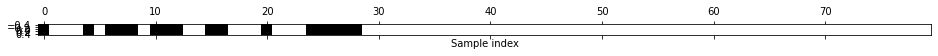

In [ ]:
mask = select.get_support()
# visualize the mask -- black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")

[[ 1.70597121e-01  1.10838975e-02  3.20798572e-03 -9.72155750e-04
  -1.17095173e-01  2.75212609e-02 -3.31050032e-01 -3.16570045e-01
  -2.82234451e-01  7.45441498e-03 -2.54501245e-01 -1.77142260e-01
   1.19958184e-01 -5.49717303e-03 -3.75638441e-02  1.13742749e-01
   2.61718833e-01 -1.69721044e-02 -8.52977546e-02  2.75476522e-02
  -4.87864686e-01 -2.16837742e-02 -6.56317878e-03  3.15968743e-03
  -3.20010825e-01 -1.26541695e-01 -8.12296719e-01 -6.37521477e-01
  -6.14326562e-01 -7.34872655e-02 -2.65626547e-02  1.93565279e-02
   2.79180422e-02  7.97950536e-02  1.08721849e-02  2.92616300e-02
  -3.62640387e-05  2.19340401e-02 -2.32029496e-02  5.13843430e-03
   6.27241636e-03 -2.85259405e-02 -2.95465676e-02 -1.71053881e-02
  -7.38319827e-02  2.41537248e-03 -2.51143313e-02  1.20666633e-02
   9.88626844e-03 -4.86627634e-02 -3.50493585e-02  4.16005545e-02
  -1.16796639e-02 -1.60476941e-02  1.80928016e-02  4.55173549e-03
  -2.83516611e-02 -3.95593600e-02  5.40569162e-02  3.16829727e-02
   3.87948

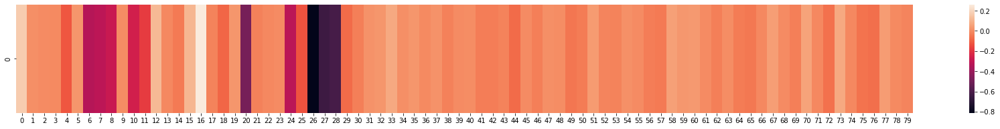

In [ ]:
plt.rcParams['figure.figsize'] = [30,3]
print(select.estimator_.coef_)
sns.heatmap(pd.DataFrame(select.estimator_.coef_))

In [ ]:
X_test_l1 = select.transform(X_test)
score = LogisticRegression(max_iter=10000).fit(X_train, y_train).score(X_test, y_test)
print("Test score: {:.3f}".format(score))
score = LogisticRegression(max_iter=10000).fit(X_train_l1, y_train).score(X_test_l1, y_test)
print("Test score: {:.3f}".format(score))

Test score: 0.951
Test score: 0.947


#Iterative Feature Selection

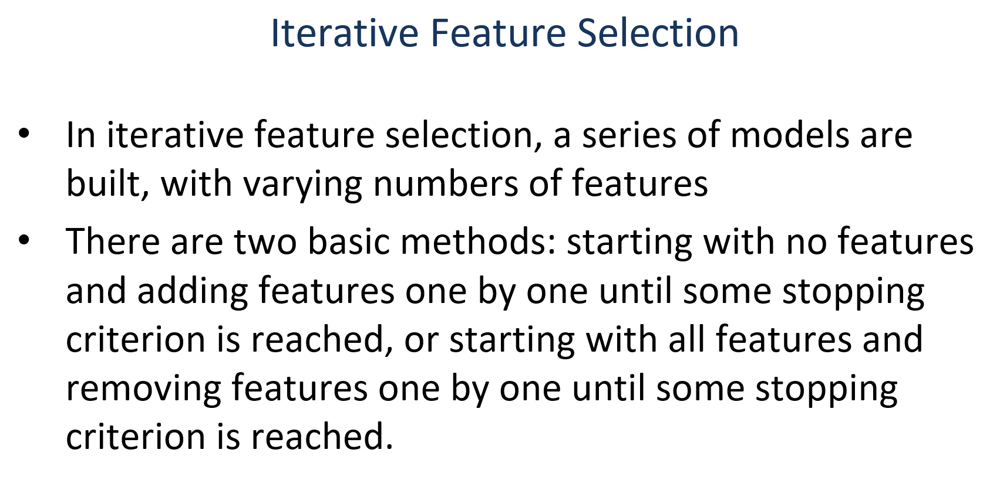

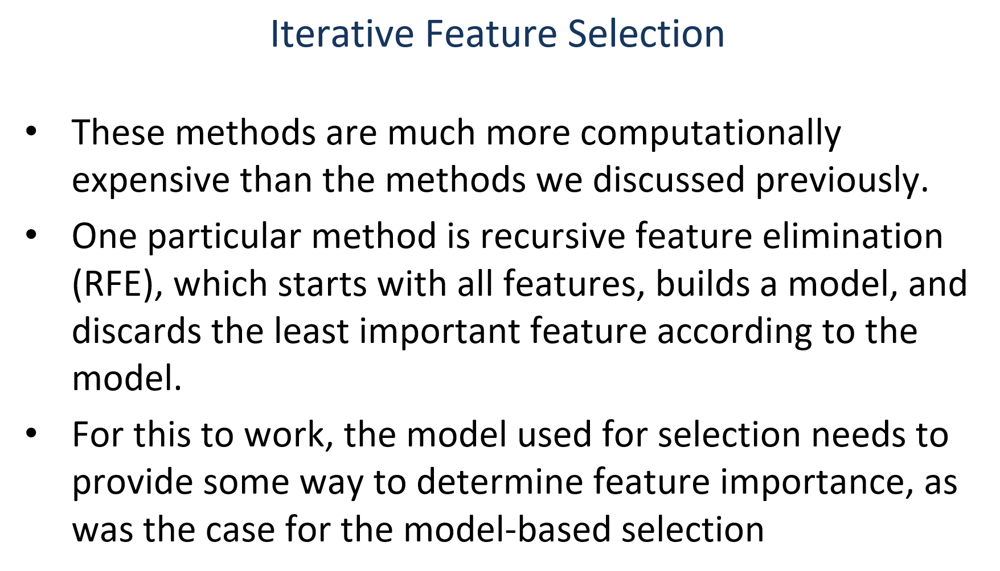

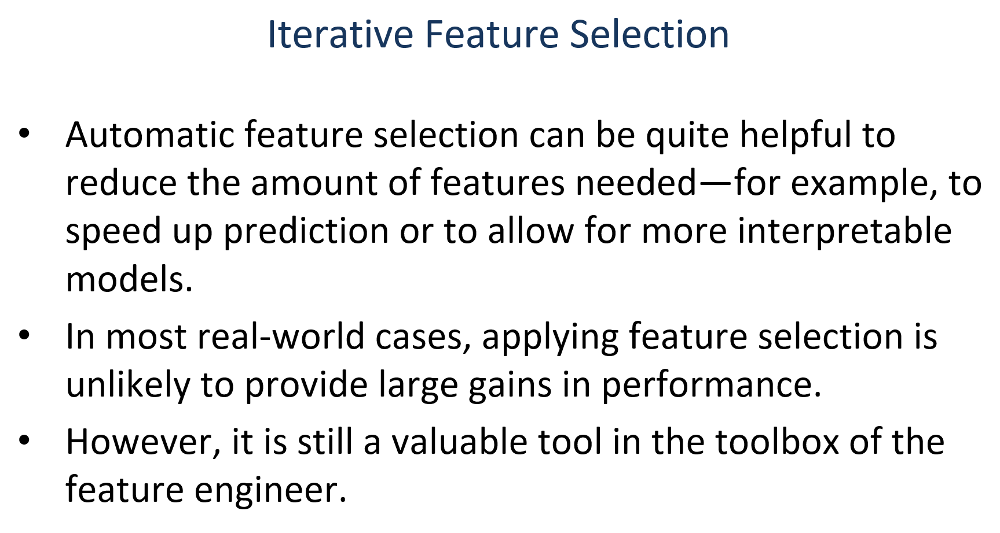

Text(0.5, 0, 'Sample index')

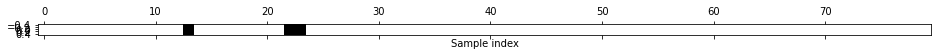

In [ ]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import RFE

select = RFE(Lasso(alpha=1),
             n_features_to_select=3)

select.fit(X_train, y_train)
# visualize the selected features:
mask = select.get_support()
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")

In [ ]:
print(select.estimator_.coef_.shape)
print(select.estimator_.coef_)


(3,)
[ 0.00017586 -0.00581895 -0.00025733]


In [ ]:
X_train_rfe= select.transform(X_train)
X_test_rfe= select.transform(X_test)

score = LogisticRegression(max_iter=10000).fit(X_train_rfe, y_train).score(X_test_rfe, y_test)
print(X_train_rfe.shape)
print("Test score: {:.3f}".format(score))

(284, 3)
Test score: 0.933


In [ ]:
print("Test score: {:.3f}".format(LogisticRegression(max_iter=10000).fit(X_train, y_train).score(X_test, y_test)))

Test score: 0.951


#Dimensionality Reduction using Principal Component Analysis (PCA)

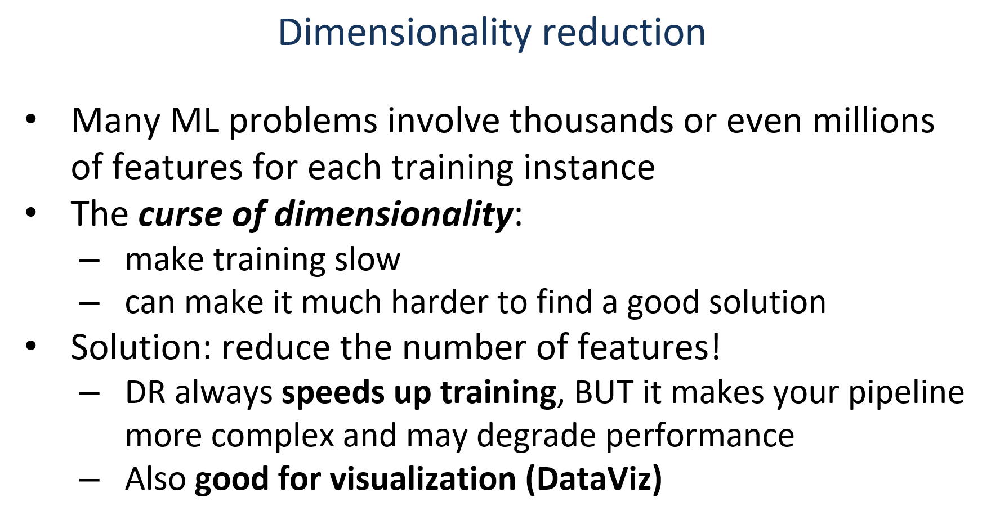

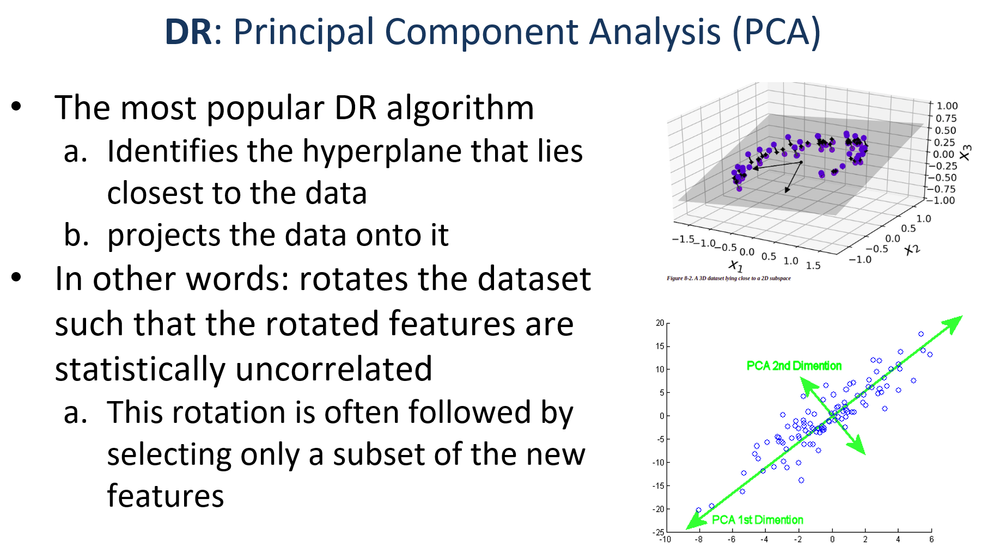

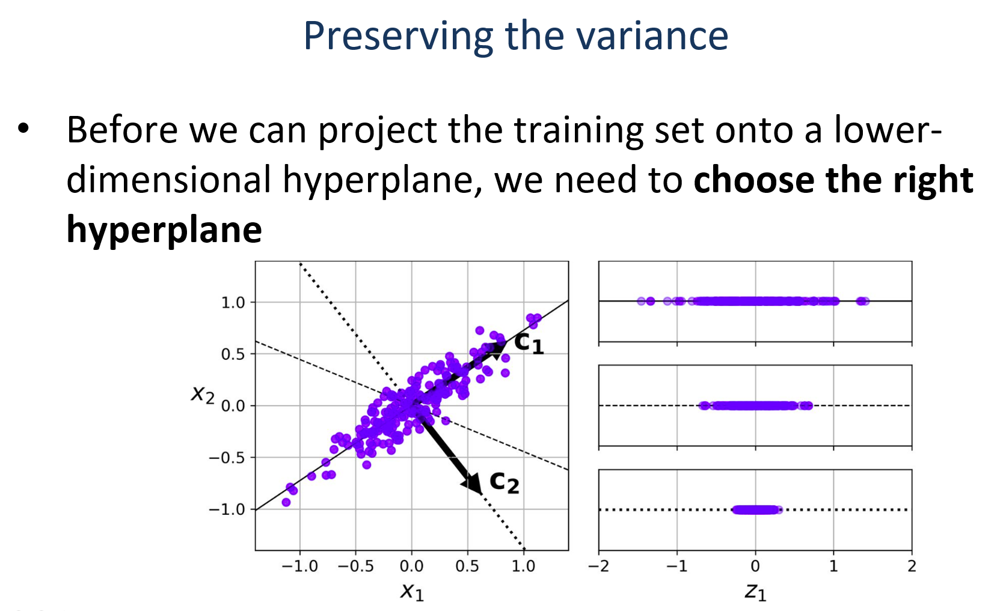

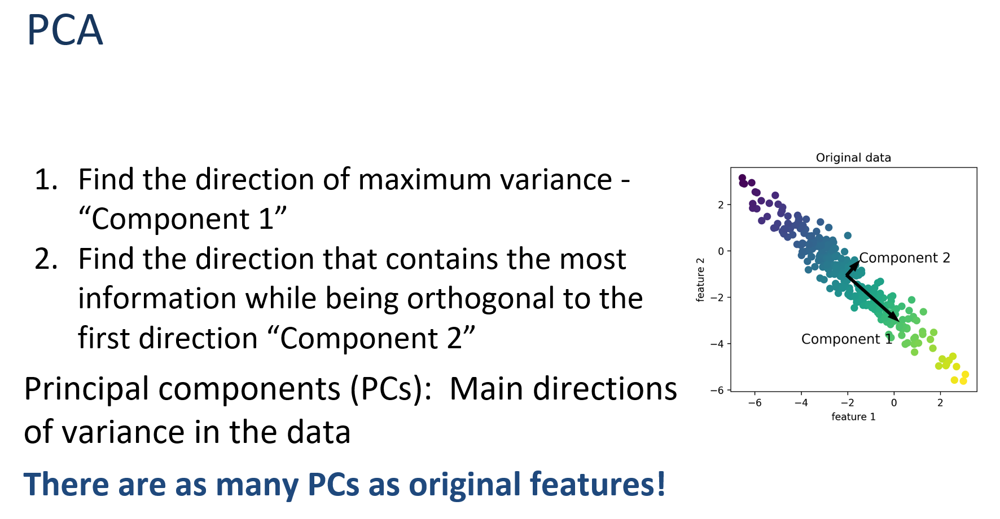

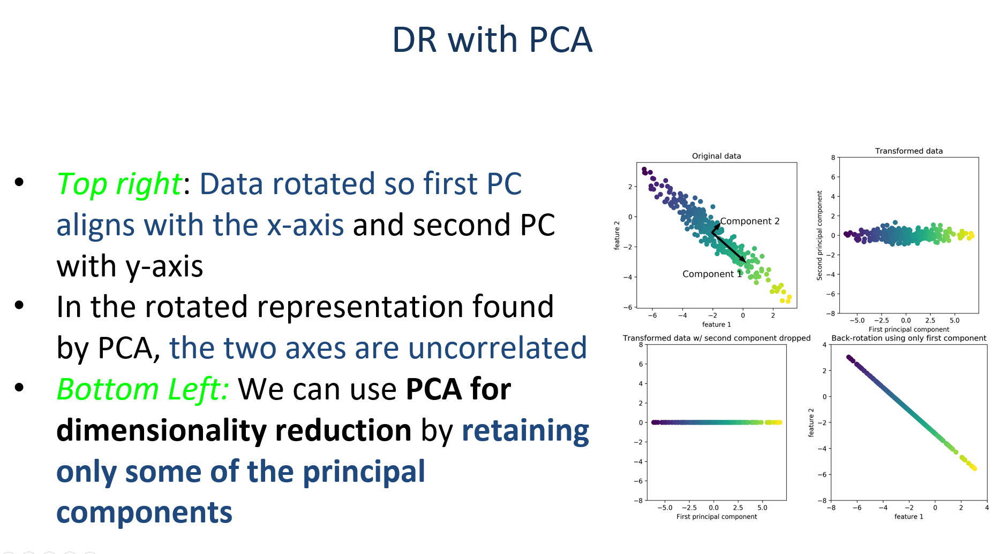

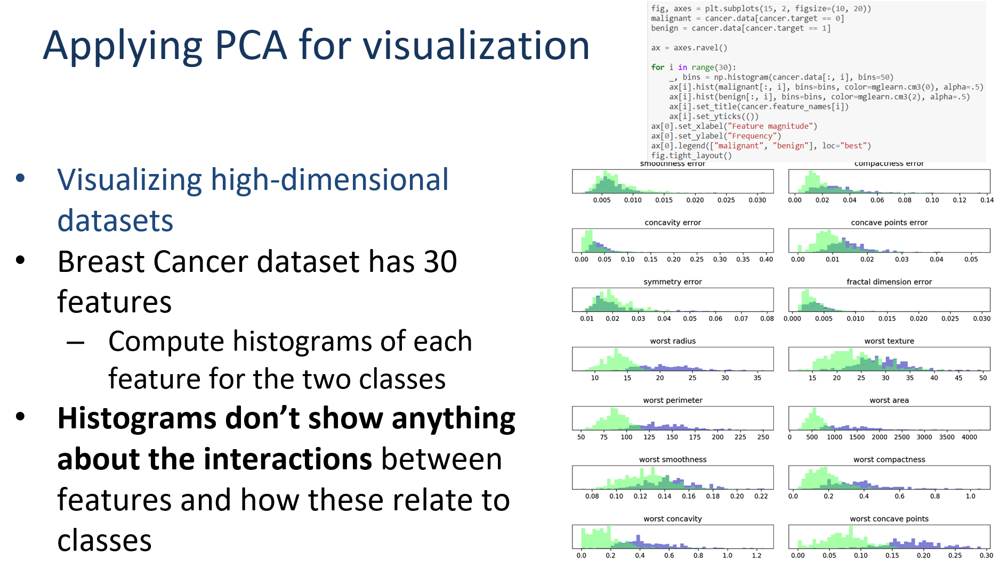

In [ ]:
f_names=[*cancer.feature_names, *np.full(50, 'Noise')]

80


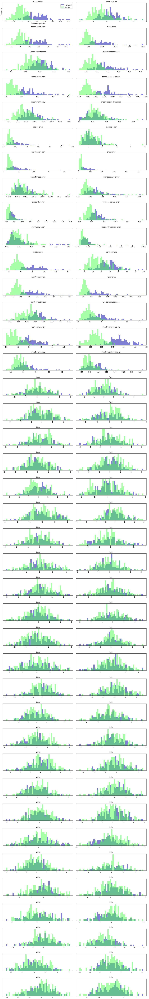

In [ ]:
malignant = X_train[y_train == 0]
benign = X_train[y_train == 1]
print(X_train.shape[1])
fig, axes = plt.subplots(X_train.shape[1]//2, 2, figsize=(15, 100))
ax = axes.ravel()

for i in range(X_train.shape[1]):
    _, bins = np.histogram(X_train[:, i], bins=50)
    ax[i].hist(malignant[:, i], bins=bins, color=mglearn.cm3(0), alpha=.5)
    ax[i].hist(benign[:, i], bins=bins, color=mglearn.cm3(2), alpha=.5)
    ax[i].set_title(f_names[i])
    ax[i].set_yticks(())
    
ax[0].set_xlabel("Feature magnitude")
ax[0].set_ylabel("Frequency")
ax[0].legend(["malignant", "benign"], loc="best")
fig.tight_layout()


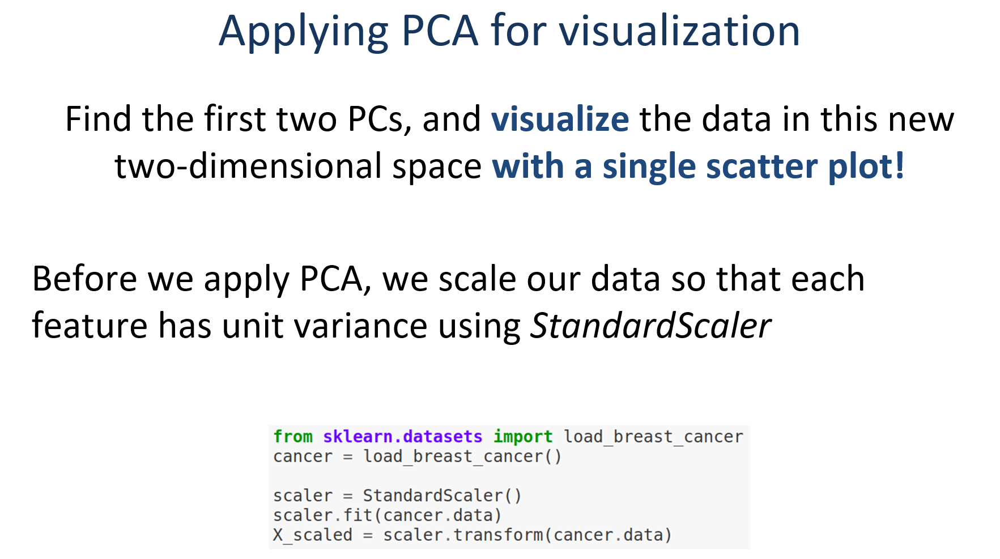

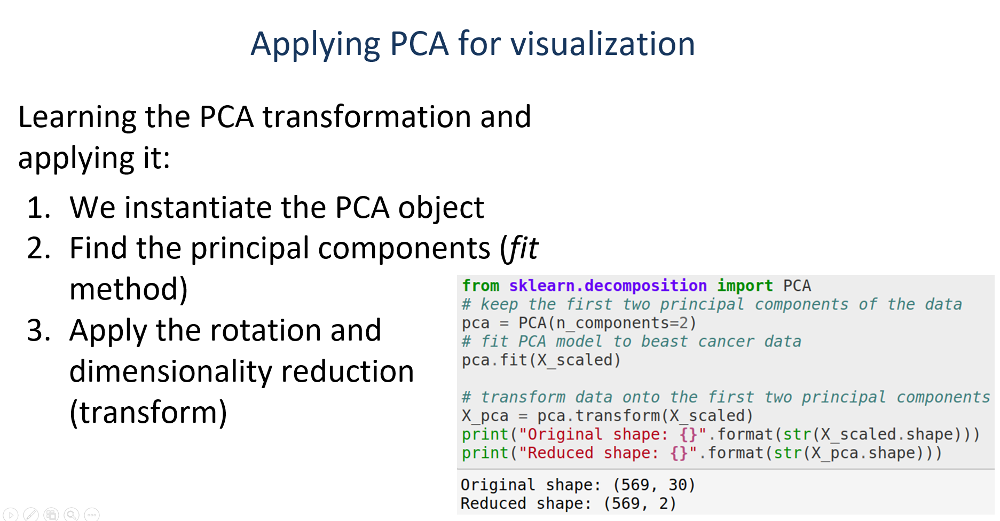

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from sklearn.decomposition import PCA
# keep the first two principal components of the data
pca = PCA(n_components=2)
# fit PCA model to breast cancer data
pca.fit(X_train_scaled)

# transform data onto the first two principal components
X_pca = pca.transform(X_train_scaled)
print("Original shape: {}".format(str(X_train_scaled.shape)))
print("Reduced shape: {}".format(str(X_pca.shape)))

Original shape: (284, 80)
Reduced shape: (284, 2)


In [ ]:
pca.explained_variance_ratio_

array([0.16260582, 0.07722499])

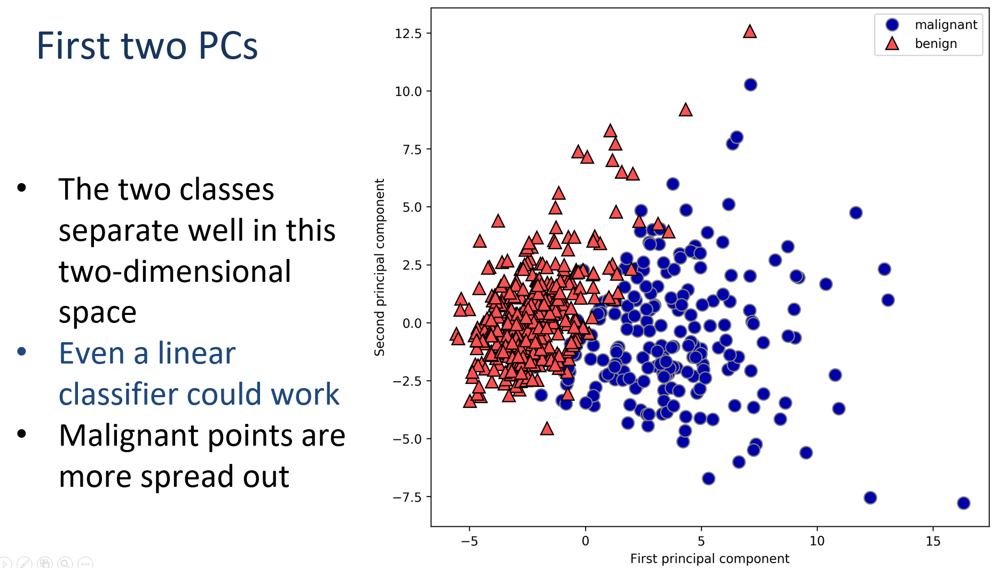

Text(0, 0.5, 'Second principal component')

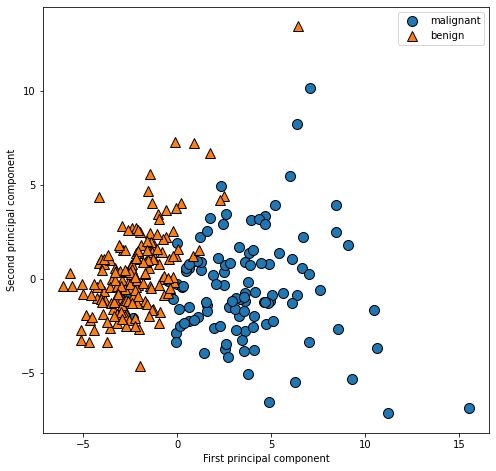

In [ ]:
# plot first vs. second principal component, colored by class
plt.figure(figsize=(8, 8))
mglearn.discrete_scatter(X_pca[:, 0], X_pca[:, 1], y_train)
plt.legend(cancer.target_names, loc="best")
plt.gca().set_aspect("equal")
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

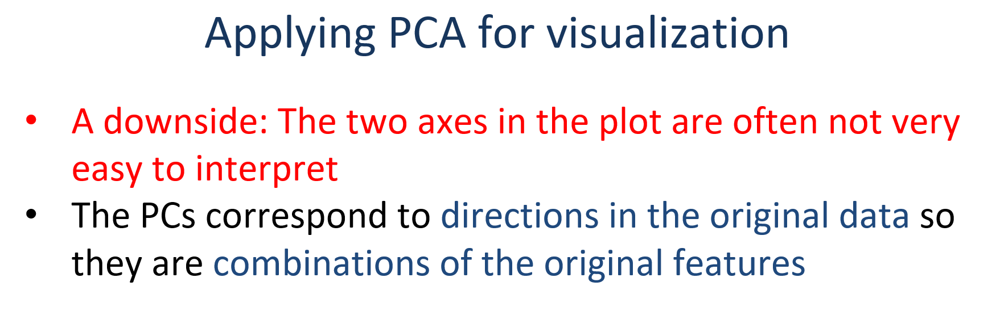

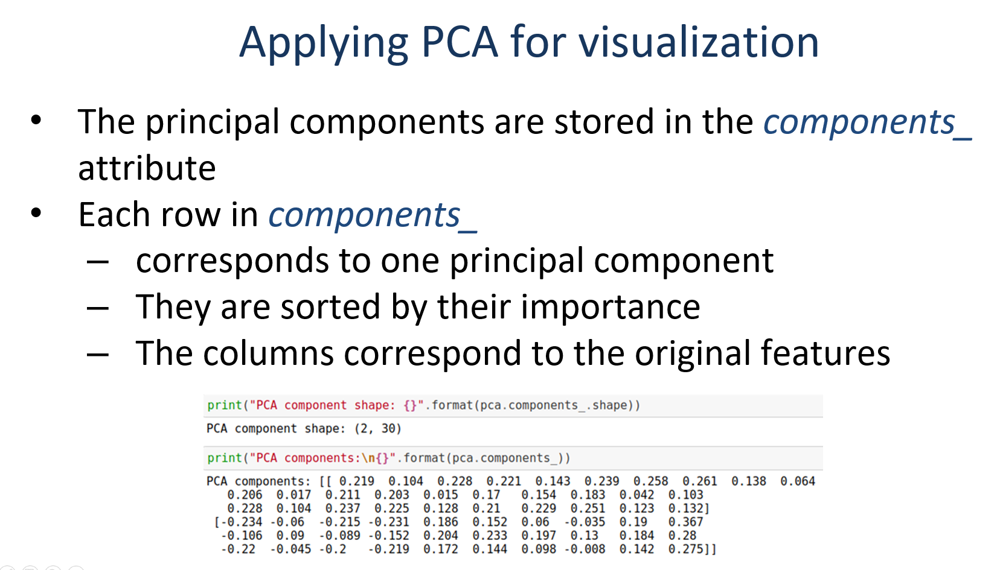

In [ ]:
print("PCA component shape: {}".format(pca.components_.shape))

PCA component shape: (2, 80)


In [ ]:
print("PCA components:\n{}".format(pca.components_))

PCA components:
[[ 0.21806929  0.0991929   0.2264322   0.21980754  0.14333965  0.24210517
   0.26106105  0.26301508  0.13084831  0.05931696  0.2083108   0.00596102
   0.21102383  0.19833025  0.01593349  0.15504952  0.13108589  0.17187769
   0.03184449  0.09178459  0.22997626  0.10141492  0.23725338  0.22645076
   0.13344434  0.20930002  0.2298717   0.25492592  0.11918208  0.12713254
   0.01431068  0.00674596  0.00906111 -0.01419004 -0.01069787 -0.04280782
   0.00969199  0.01046866  0.00621359  0.00660637  0.01375015 -0.00796712
  -0.00707175  0.03033192 -0.0098521  -0.01995611 -0.01857367  0.01706571
   0.00479396  0.01054293 -0.00867806 -0.03698374 -0.00996105 -0.0222776
   0.00206312 -0.00788769 -0.02491572  0.02103252 -0.03509493  0.00317078
  -0.01715652  0.00945833 -0.0127756   0.02017241 -0.01371874  0.01050793
   0.00678627 -0.04609119 -0.00433582  0.00548879  0.01470302  0.01926664
   0.02883521 -0.03676926 -0.02731953  0.02177138 -0.01603397  0.00340787
  -0.00617267 -0.012202

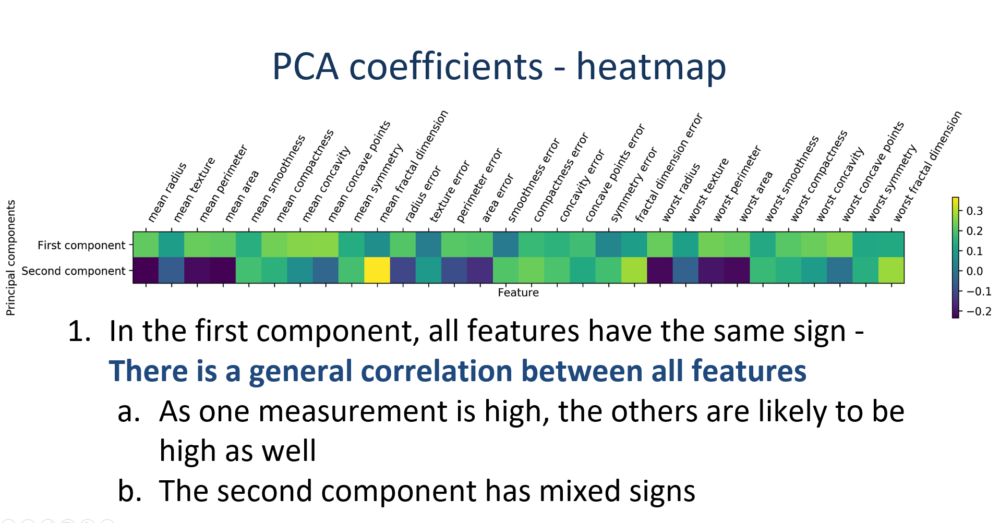

Text(0, 0.5, 'Principal components')

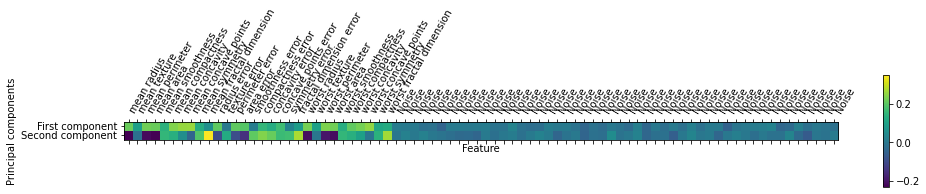

In [ ]:
plt.rcParams['figure.figsize'] = [30,3]
plt.matshow(pca.components_, cmap='viridis')
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(range(len(f_names)),
           f_names, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components")

In [ ]:
X_pca = pca.transform(X_train_scaled)
X_pca_test = pca.transform(X_test_scaled)
logreg = LogisticRegression( solver='liblinear').fit(X_pca, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_pca, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_pca_test, y_test)))


Training set score: 0.961
Test set score: 0.944
